### Authors: Milena Biernacka, Agata Dratwa, Karol Augustyniak

# Multi-Dimension Scaling 
is a distance-preserving manifold learning method. All manifold learning algorithms assume the dataset lies on a smooth, non linear manifold of low dimension and that a mapping f: $R^{D}$ -> $R^{d}$ (D>>d) can be found by preserving one or more properties of the higher dimension space. Distance preserving methods assume that a manifold can be defined by the pairwise distances of its points. In distance preserving methods, a low dimensional embedding is obtained from the higher dimension in such a way that pairwise distances between the points remain same. Some distance preserving methods preserve spatial distances (MDS) while some preserve graph distances.

MDS is not a single method but a family of methods. MDS takes a dissimilarity matrix $D$ where $D_{ij}$ represents the dissimilarity between points $i$ and $j$ and produces a mapping on a lower dimension, preserving the dissimilarities as closely as possible. The dissimilarity matrix could be observed or calculated from the given dataset.

MDS can be divided into two categories:

- **Metric MDS** - Metric MDS is used for quantitative data and tries to preserve the original dissimilarity metrics. 

- **Non-Metric MDS** - Non-metric MDS is used for ordinal data. It tries to keep the order of dissimialrity metrics intact.

# t-Distributed Stochastic Neighbor Embedding (t-SNE)

t-Distributed Stochastic Neighbor Embedding (t-SNE) is a non-linear technique for dimensionality reduction that is particularly well suited for the visualization of high-dimensional datasets. It is extensively applied in image processing, NLP, genomic data and speech processing. To keep things simple, here’s a brief overview of working of t-SNE:

- The algorithms starts by calculating the probability of similarity of points in high-dimensional space and calculating the probability of similarity of points in the corresponding low-dimensional space. The similarity of points is calculated as the conditional probability that a point A would choose point B as its neighbor if neighbors were picked in proportion to their probability density under a Gaussian (normal distribution) centered at A.

- It then tries to minimize the difference between these conditional probabilities (or similarities) in higher-dimensional and lower-dimensional space for a perfect representation of data points in lower-dimensional space.

- To measure the minimization of the sum of difference of conditional probability t-SNE minimizes the sum of Kullback-Leibler divergence of overall data points using a gradient descent method.


In simpler terms, t-Distributed stochastic neighbor embedding (t-SNE) minimizes the divergence between two distributions: a distribution that measures pairwise similarities of the input objects and a distribution that measures pairwise similarities of the corresponding low-dimensional points in the embedding.

In this way, t-SNE maps the multi-dimensional data to a lower dimensional space and attempts to find patterns in the data by identifying observed clusters based on similarity of data points with multiple features. However, after this process, the input features are no longer identifiable, and you cannot make any inference based only on the output of t-SNE. Hence it is mainly a data exploration and visualization technique.

I recommend to familiarize with this amazing blogpost https://distill.pub/2016/misread-tsne/ which graphically shows traps associated with use of t-SNE and how  hyperparameters selection can  affect final embeding.



Algorytm ogólnie działa w dwóch fazach:
1. DLa każdego punktu obliczane sa prawdopodobieństwa odległości między tym punktem, a innymi punktami w zbiorze danych. Im dwa punkty są blizej siebie w wysokowymairowej przestrzeni, tym większe prawdopodobieństwo że zostan≥ą uznane za podobne
2. Algorytm proektuje punkty danych na niskowymiarową przestrzeń przy zachowaniu ich wzajemnych relacji podobieństwa lub niepodobieństwa. Im bardziej podobne tym bliżej siebie

### To better illustrate properties of individual methods of reducing dimensionality (from this and previous lab), create a set of points in the shape of a roulade.  To do it:

1. Prepare a point generator for the circles in this generator, ensure that the radius decreases with the next steps (in this way you will get a spiral)

2. Treat the spiral as a cross-sectional solid, creating a croissant / crescent roll

3. Move the points in the roll with a slight noise to avoid their perfect placement

4. For better visualization, you can give individual points a color depending, e.g. on the distance from the center of the roulade

5. Generated roulade should resemble the picture below

In [1]:
from time import time
import math
import random
import glob

import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
from matplotlib.cbook import get_sample_data
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
sn.set(color_codes=True)
np.random.seed(1234)
#mkl.set_num_threads(4)
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = [20, 20]



## Roulade points generator

In [2]:
def random_spiral_point(density=2):
    p = random.random()**0.5
    return p*math.cos(p*density*np.pi*2), p*math.sin(p*density*np.pi*2)

def uniform_spiral(density=3, steps = 100):
    x, y = [] ,[]
    for i in range(steps):
        x.append((i/steps)**0.5*math.cos((i/steps)**0.5*density*np.pi*2))
        y.append((i/steps)**0.5*math.sin((i/steps)**0.5*density*np.pi*2))
        
    return x, y
        
def spiral2roll(xli, yli, width=7, angle=0.1):
    nx, ny, nz, d = [], [], [], []
    for x,y in zip(xli, yli):
        p = random.random()
        nx.append((width+x)*math.cos(angle*p*np.pi*2))
        ny.append((width+x)*math.sin(angle*p*np.pi*2))
        nz.append(y)
        d.append((x**2+y**2)**0.5)
    return nx, ny, nz, d

def uniform_roll(xli, yli, width=7, angle=0.25, density=5, noise_factor=0.05):
    nx, ny, nz, d = [], [], [], []
    d1 = [((x**2+y**2)**0.5) for x,y in zip(xli, yli)]
    for i in range(density):
        nx.extend([(width+x)*math.cos(angle*i/density*np.pi*2) + (random.random()-0.5)*noise_factor for x in xli])
        ny.extend([(width+x)*math.sin(angle*i/density*np.pi*2) + (random.random()-0.5)*noise_factor  for x in xli])
        nz.extend(yli)
        d.extend(d1) 
    return nx, ny, nz, d  


def roll_generator(to_array=True, spiral_density=3, spiral_steps = 20, width=7, angle=0.3, density=5):
    x, y = uniform_spiral(density=spiral_density, steps = spiral_steps)
    x,y,z,d = uniform_roll(x, y, width=width, angle=angle, density=density)
       
    if to_array:
        return np.array([x,y,z]).T, d
    else:
        return x,y,z,d
        

In [3]:
def plot_roulade(x,y,z,d=None):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])
    

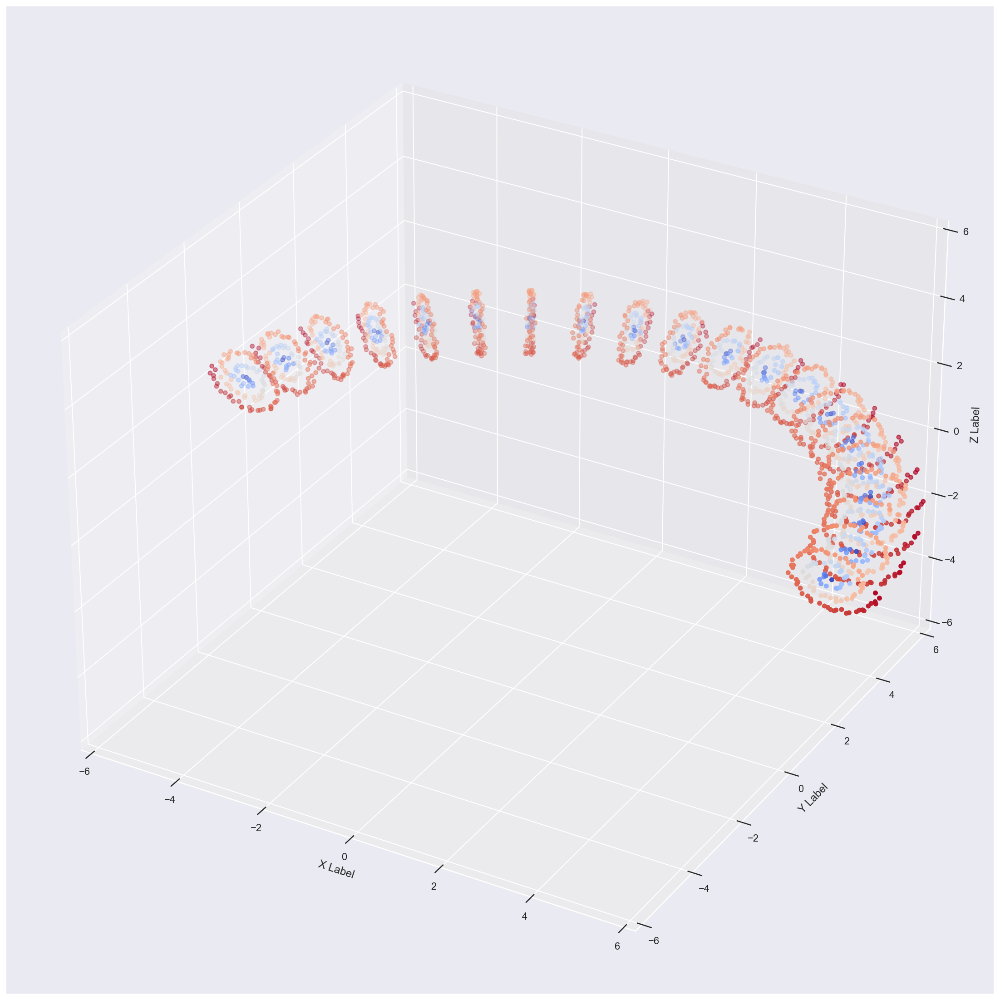

In [4]:
xl, yl = uniform_spiral()
x,y,z,d = uniform_roll(xl,yl, width=7, angle=0.5, density=20, noise_factor=0.15)
plot_roulade(x,y,z,d=d)

#### Visualize the prepared set of points by projecting onto a 2D plane, changing the following aspects in subsequent approaches:

1. Density of points generated, in terms of points per spiral

2. Distance between roll layers, layer density

3. Visualization method: PCA, KernelPCA, MDS, t-SNE

4. generate at least a few plots per method

Dobrze byłoby około 50 obrazków

#### Save each generated chart, you will later need it to embeding images

#### PCA implementation

In [5]:
# Jest to funckja, która najpierw tworzy punkty w 3 wymiarach, a potem redukuje wymiarowosc do 2, za pomocą PCA.
def show_PCA(spiral_density=3, spiral_steps = 20, width=7, angle=0.5, roll_density=5):
    fig = plt.figure()
    x,y,z,d=roll_generator(to_array=False, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)
    from mpl_toolkits.mplot3d import Axes3D

    # fig = plt.figure()
    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])

    ax2 = fig.add_subplot(122)
    points, d=roll_generator(to_array=True, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)

    from sklearn.decomposition import PCA
    embedding = PCA(n_components=2)
    points_transformed = embedding.fit_transform(points)
    points_transformed.shape

    points_transformed_t = points_transformed.T
    points_transformed_t.shape

    ax2.scatter(points_transformed_t[0], points_transformed_t[1], c=d, cmap=plt.cm.coolwarm)
    ax2.set_xlabel('X Label')
    ax2.set_ylabel('Y Label')
    
    plt.rcParams["figure.figsize"] = [12, 6]
    
    extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f'pca_spst{spiral_steps}_roldens{roll_density}_w{width}_a{angle}_sd{spiral_density}.png', bbox_inches=extent)

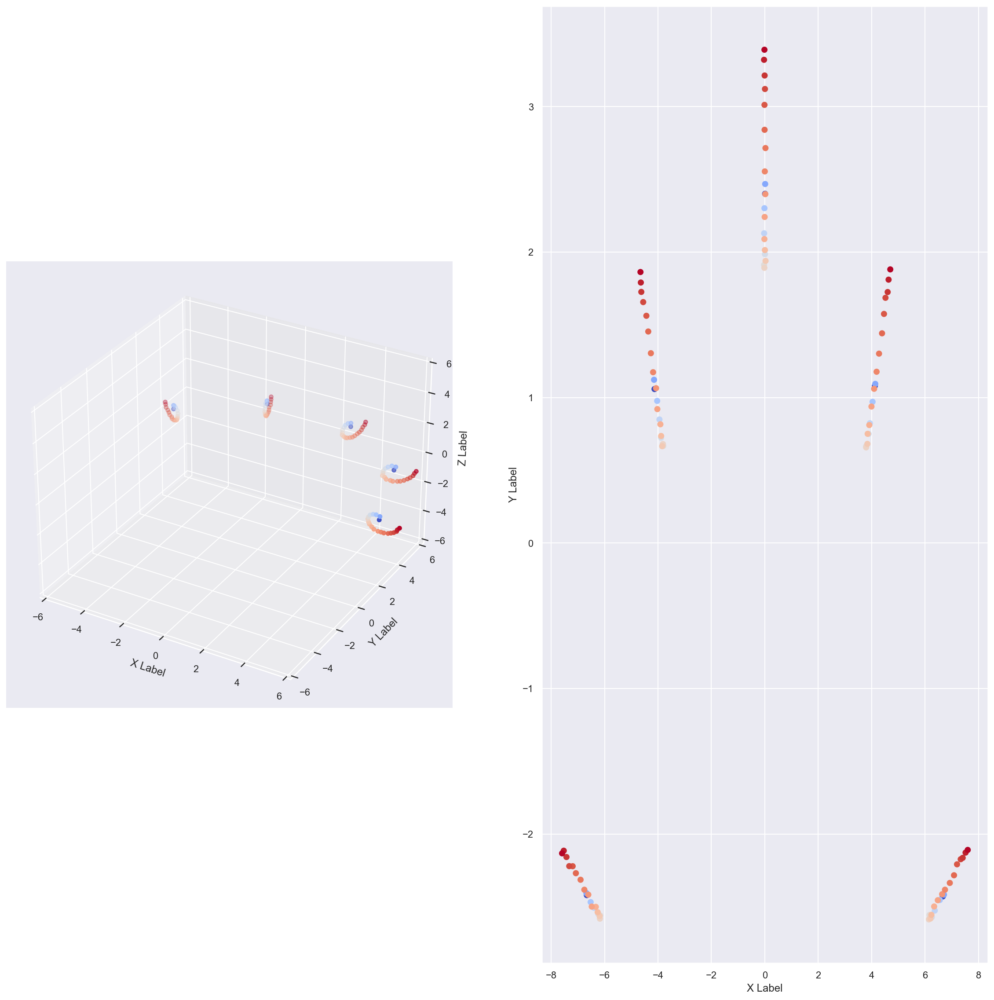

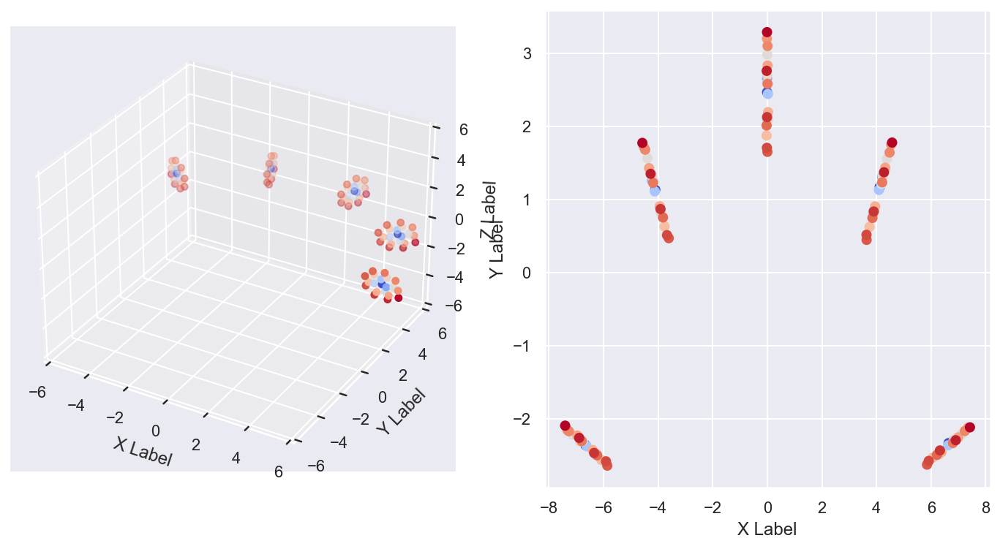

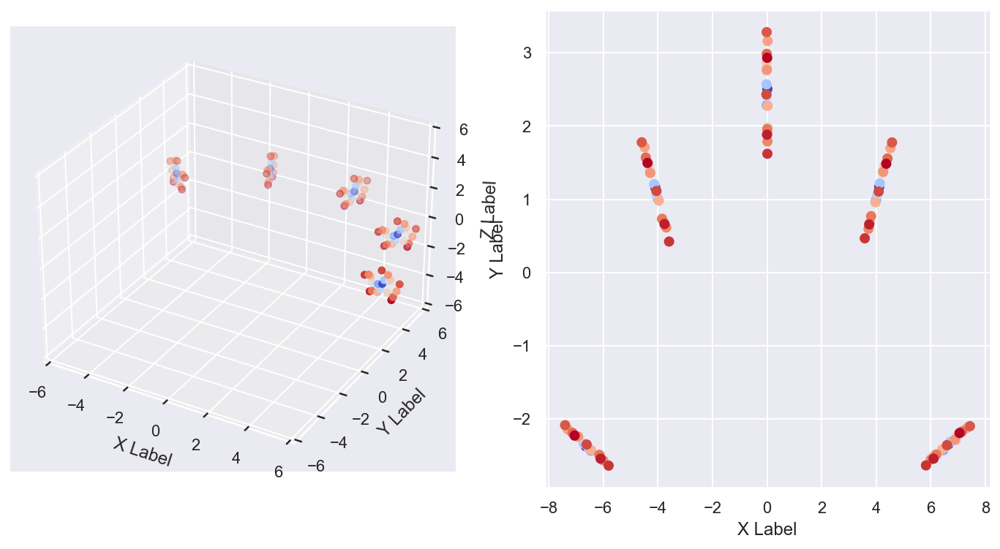

In [6]:
# TODO
# changing spiral density
for i in range(1,9,3):
    show_PCA(spiral_density=i, spiral_steps = 20, width=7, angle=0.5, roll_density=5)

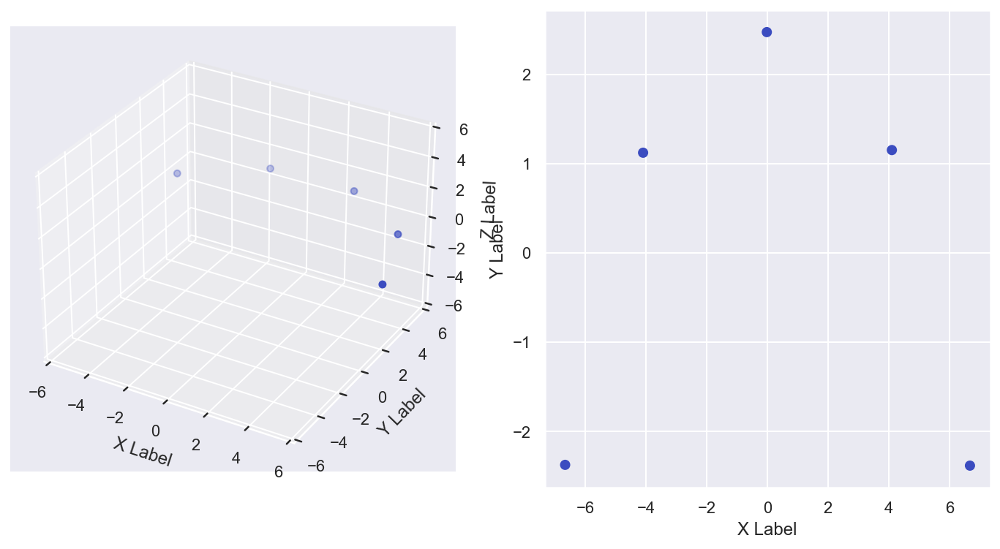

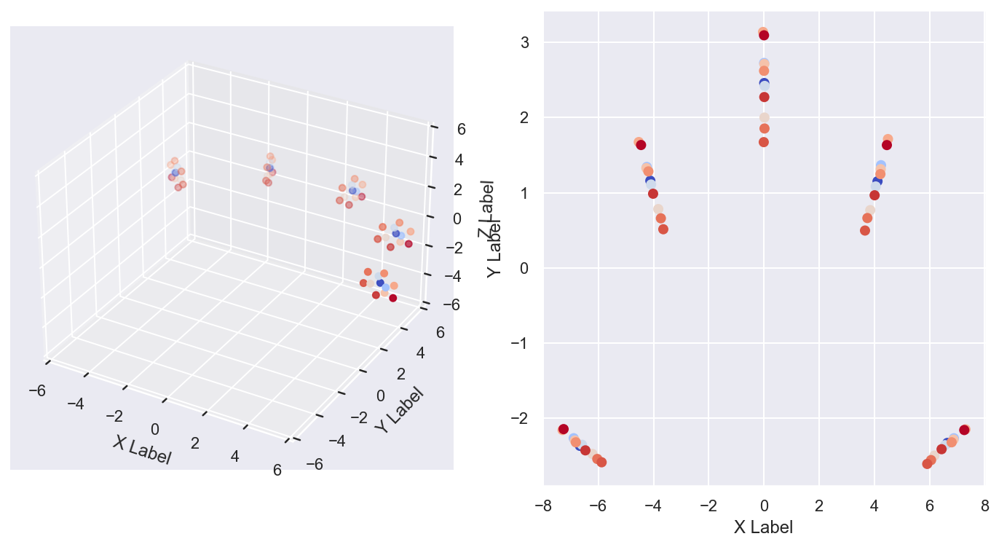

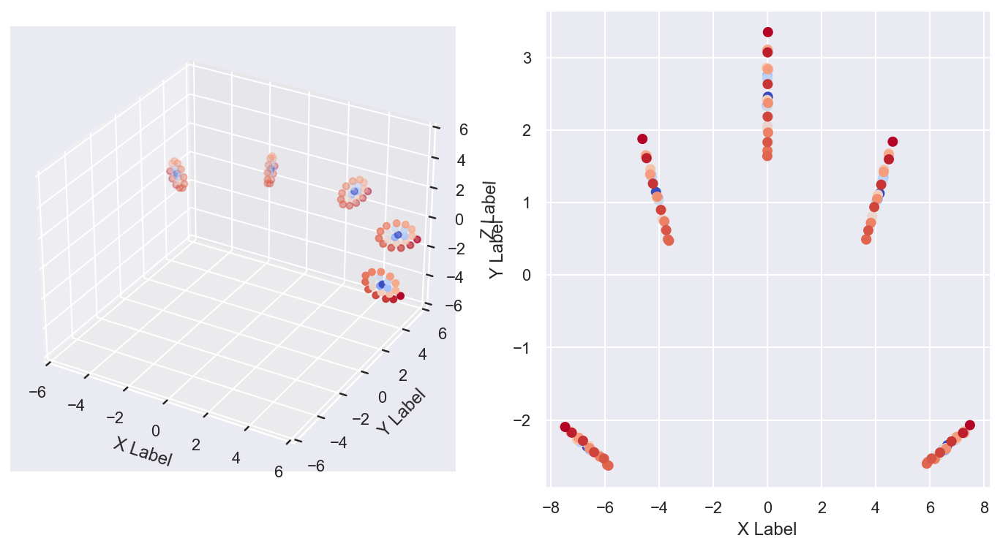

In [7]:
# TODO
# changing spiral steps
for i in range(1,30,10):
    show_PCA(spiral_density=3, spiral_steps = i, width=7, angle=0.5, roll_density=5)

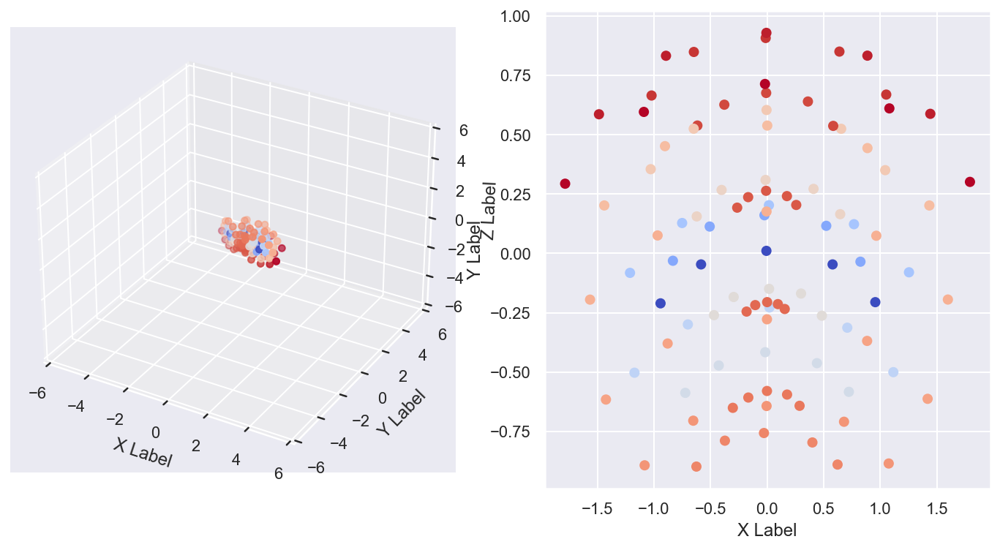

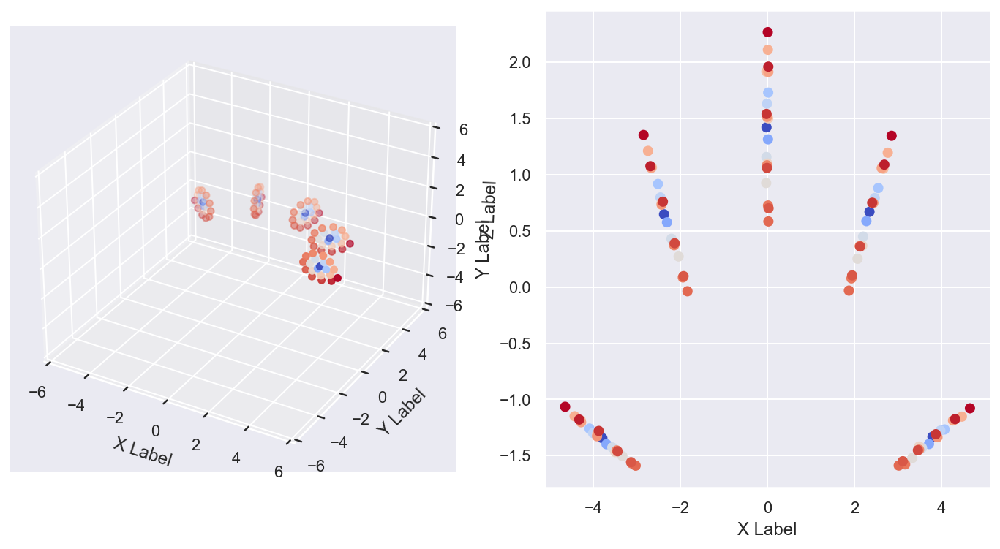

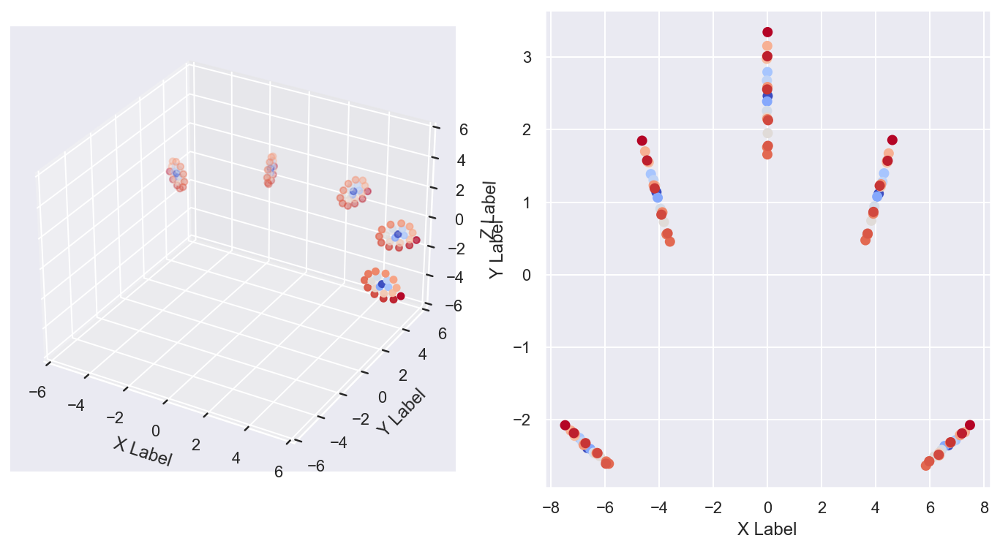

In [8]:
# TODO
# changing spiral width
for i in range(1,9,3):
    show_PCA(spiral_density=3, spiral_steps = 20, width=i, angle=0.5, roll_density=5)

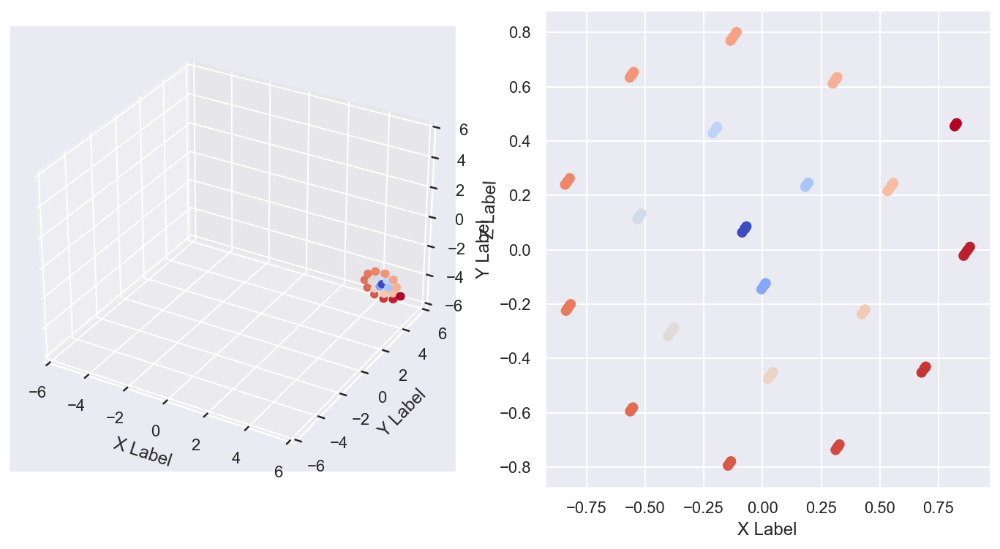

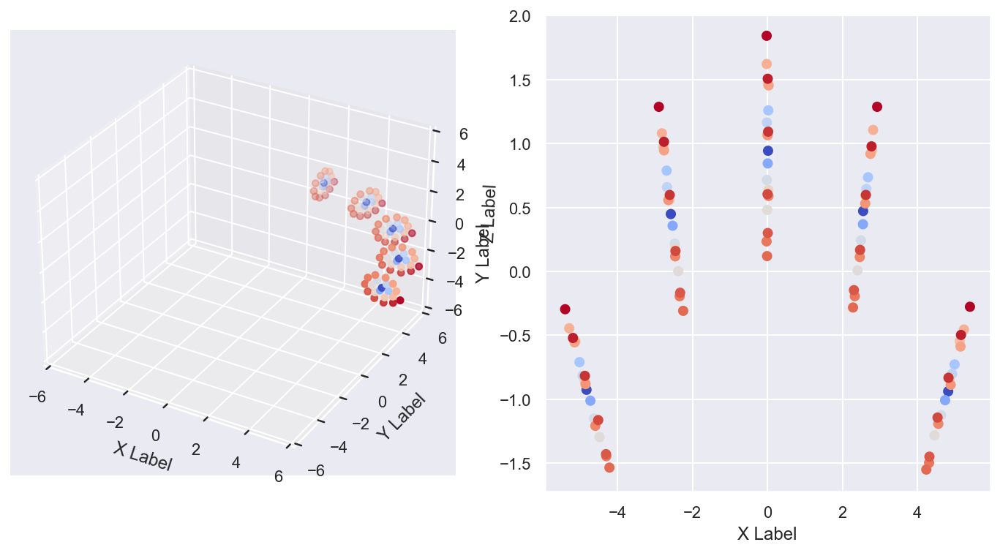

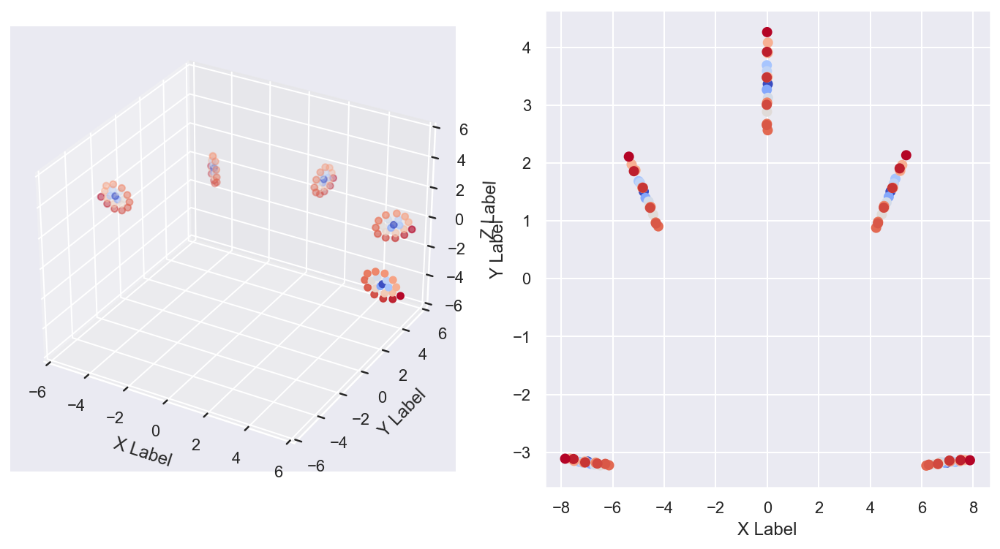

In [9]:
# TODO
# changing angle
for i in np.arange(0,0.9,0.3):
    show_PCA(spiral_density=3, spiral_steps = 20, width=7, angle=i, roll_density=5)

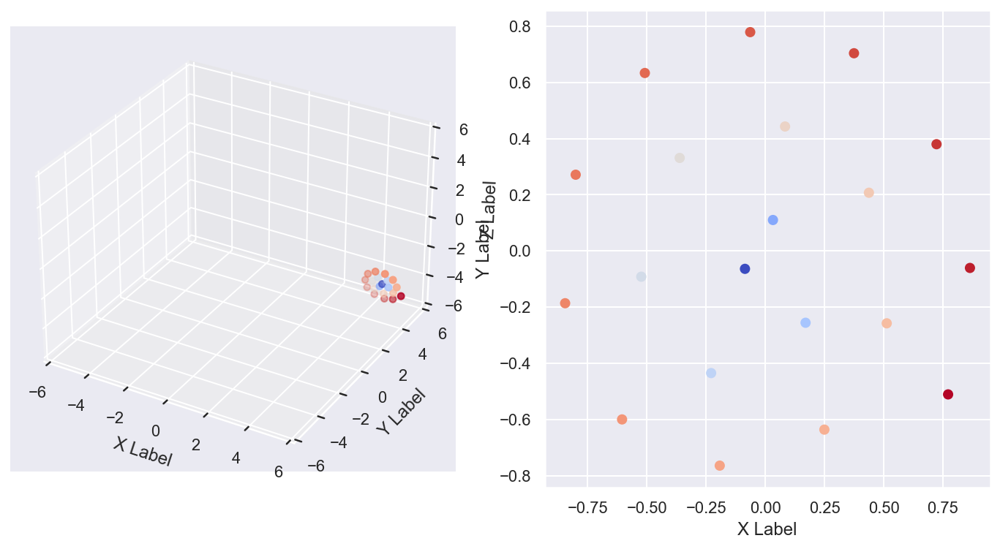

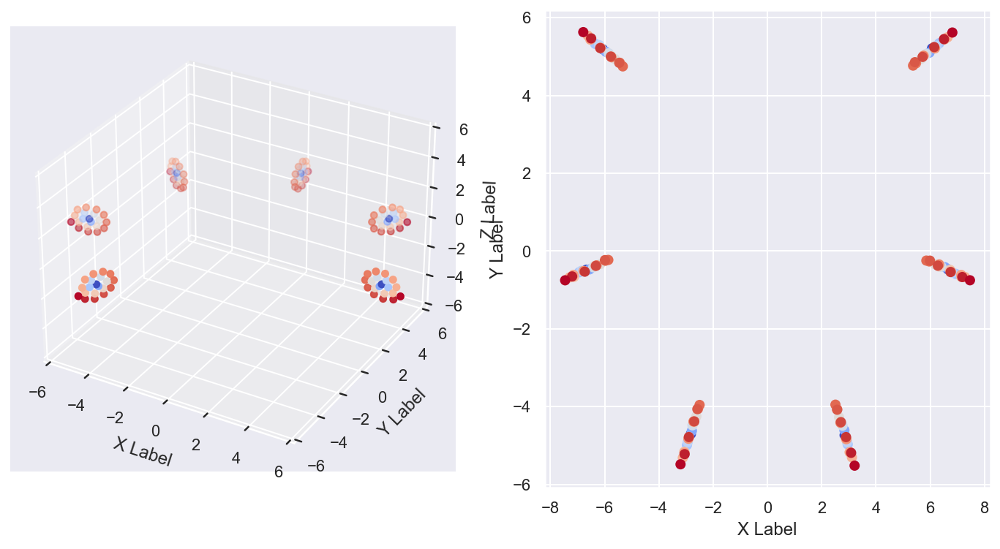

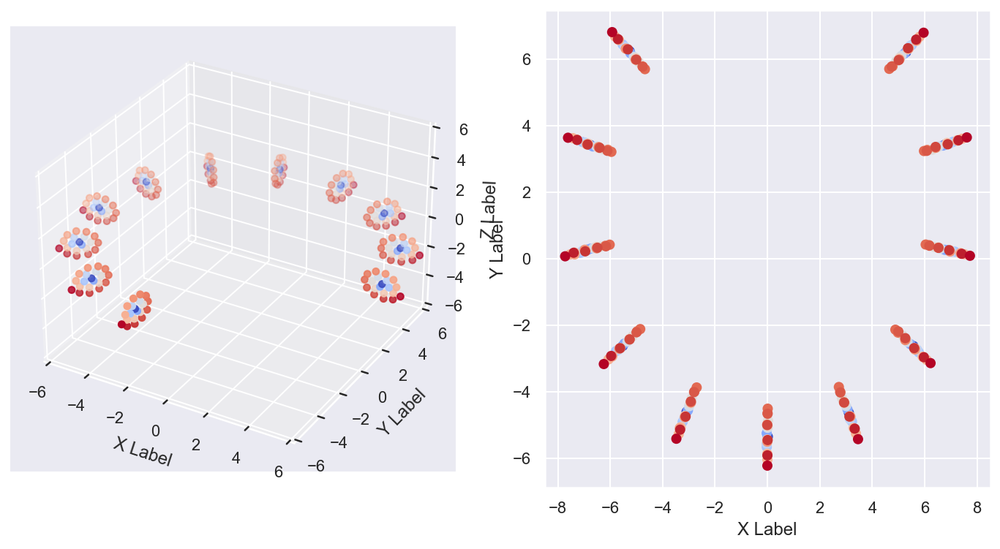

In [10]:
# TODO
# changing roll density
for i in range(1,16,5):
    show_PCA(spiral_density=3, spiral_steps = 20, width=7, angle=0.8, roll_density=i)

#### KernelPCA implementation

In [11]:
def show_KernelPCA(spiral_density=3, spiral_steps = 20, width=7, angle=0.5, roll_density=5):
    fig = plt.figure()
    x,y,z,d=roll_generator(to_array=False, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)
    from mpl_toolkits.mplot3d import Axes3D

    # fig = plt.figure()
    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])

    ax2 = fig.add_subplot(122)
    points, d=roll_generator(to_array=True, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)

    from sklearn.decomposition import KernelPCA
    embedding = KernelPCA(n_components=2)
    points_transformed = embedding.fit_transform(points)
    points_transformed.shape

    points_transformed_t = points_transformed.T
    points_transformed_t.shape

    ax2.scatter(points_transformed_t[0], points_transformed_t[1], c=d, cmap=plt.cm.coolwarm)
    ax2.set_xlabel('X Label')
    ax2.set_ylabel('Y Label')
    
    plt.rcParams["figure.figsize"] = [12, 6]
    
    extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f'kpca_spst{spiral_steps}_roldens{roll_density}_w{width}_a{angle}_sd{spiral_density}.png', bbox_inches=extent)

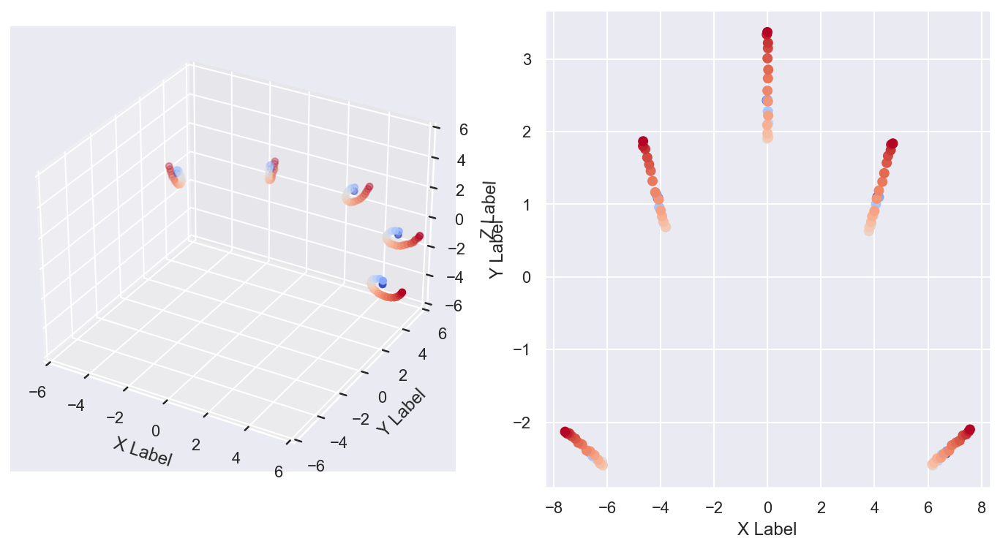

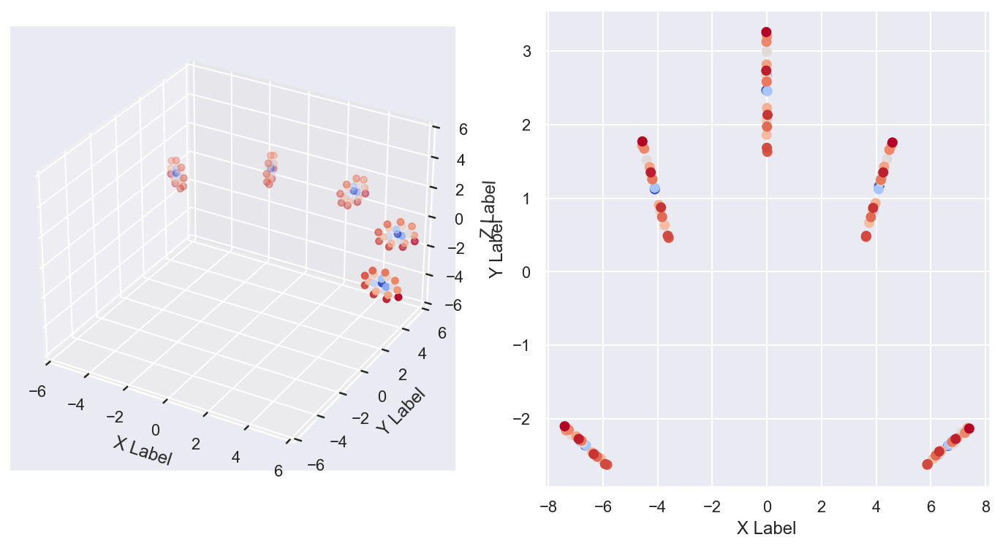

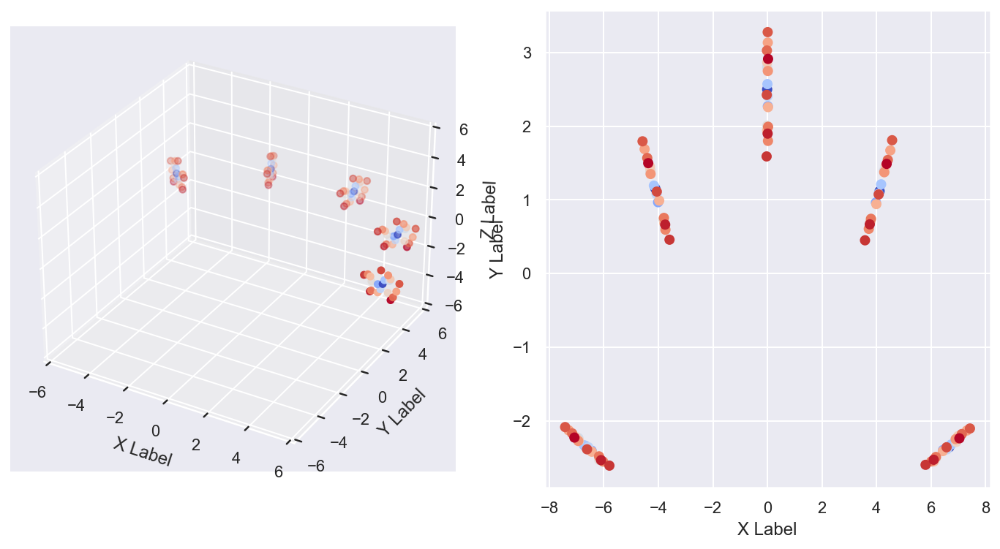

In [12]:
# TODO
# changing spiral density
for i in range(1,9,3):
    show_KernelPCA(spiral_density=i, spiral_steps = 20, width=7, angle=0.5, roll_density=5)

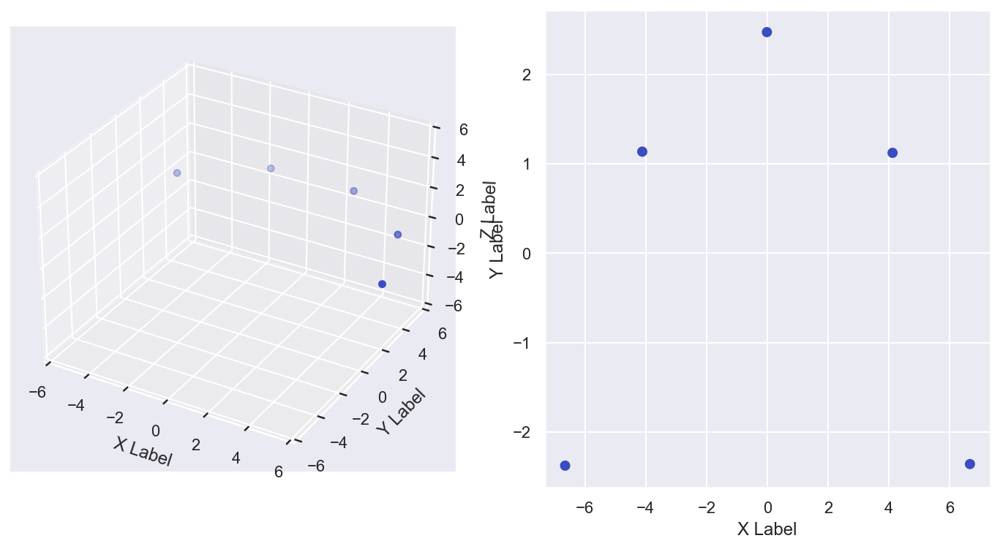

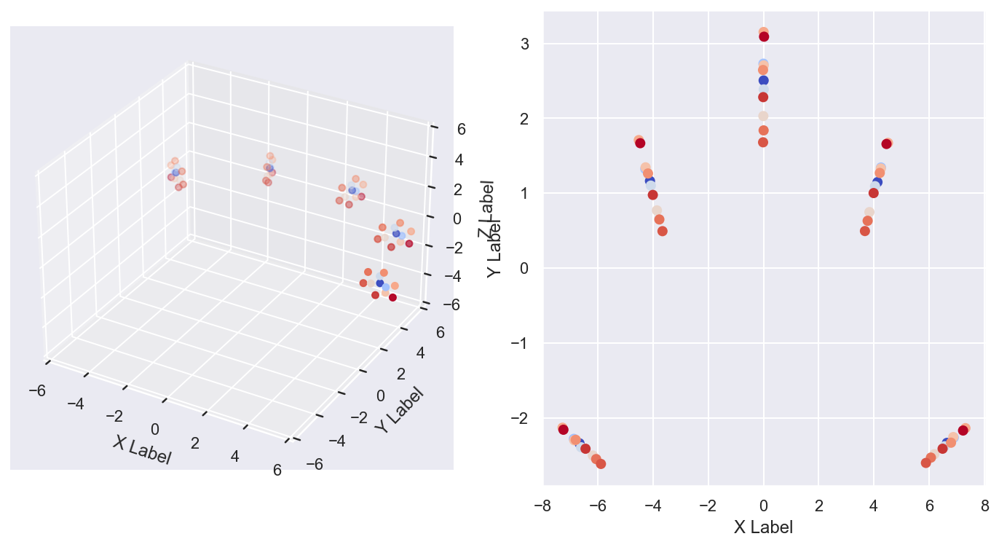

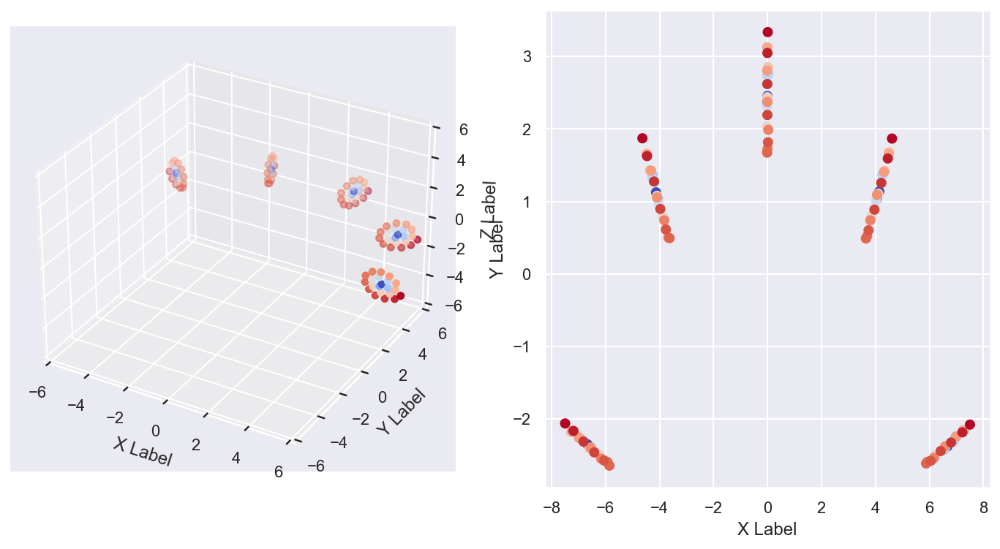

In [13]:
# TODO
# changing spiral steps
for i in range(1,30,10):
    show_KernelPCA(spiral_density=3, spiral_steps = i, width=7, angle=0.5, roll_density=5)

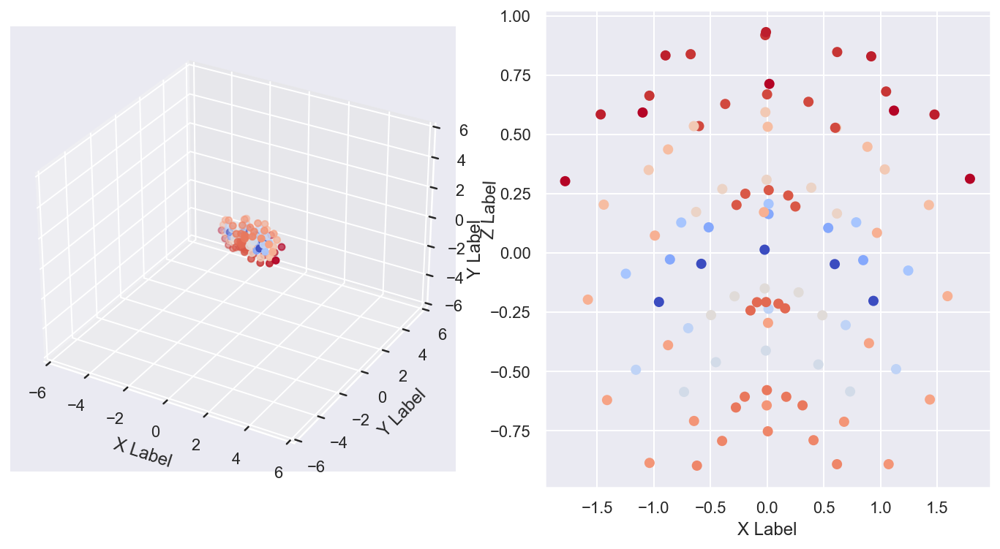

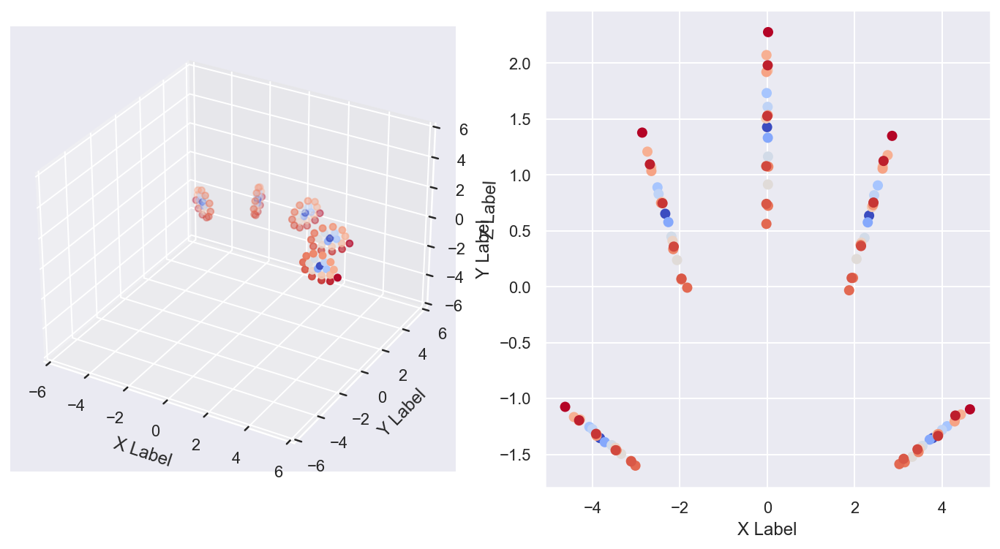

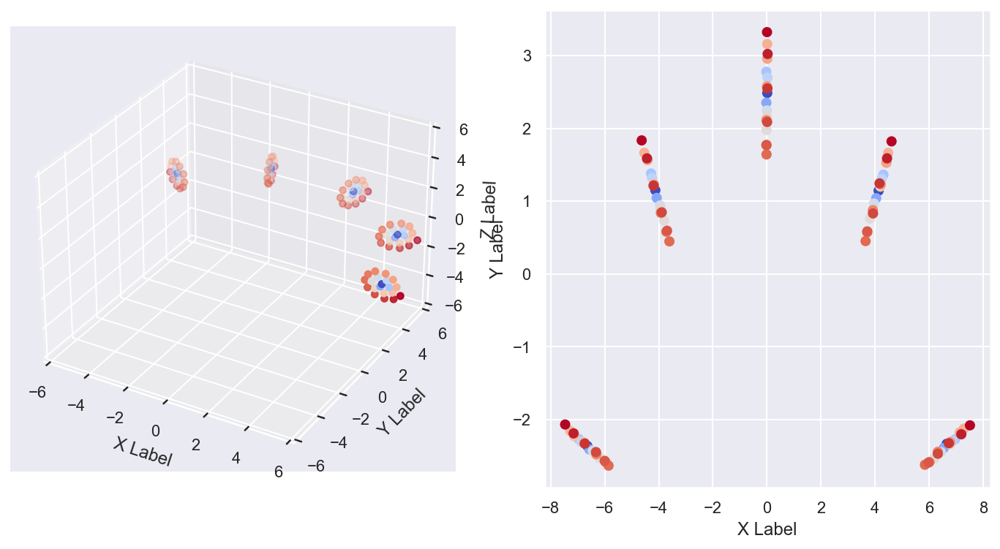

In [14]:
# TODO
# changing spiral width
for i in range(1,9,3):
    show_KernelPCA(spiral_density=3, spiral_steps = 20, width=i, angle=0.5, roll_density=5)

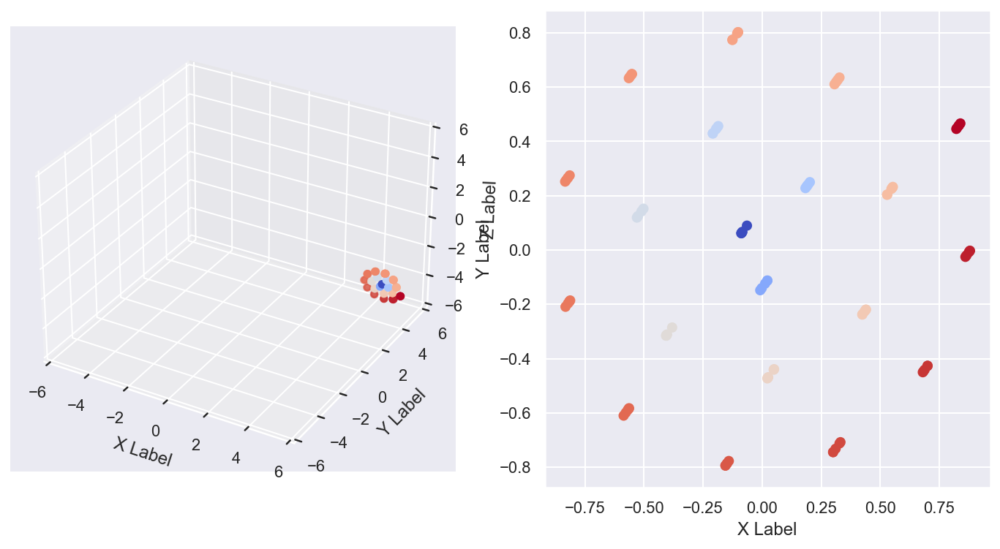

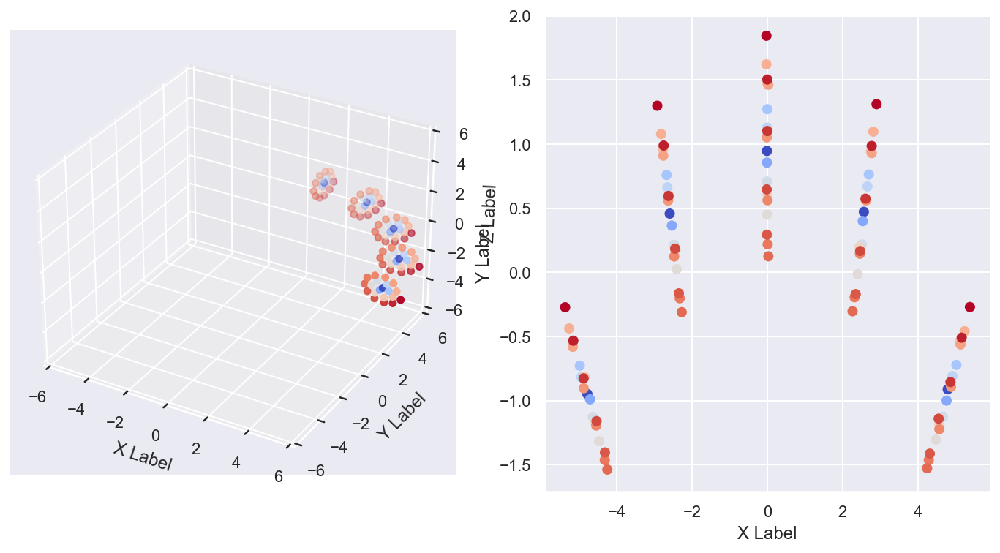

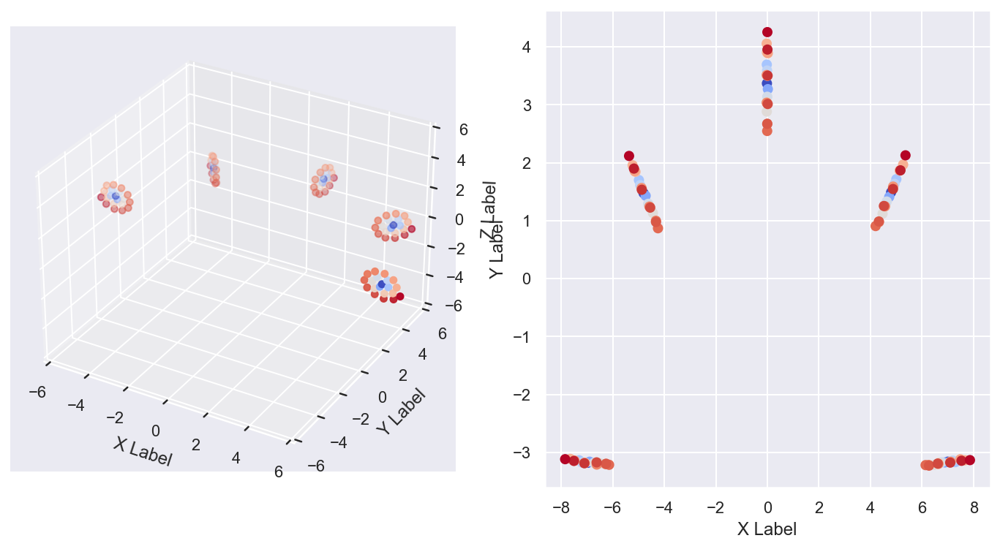

In [15]:
# TODO
# changing angle
for i in np.arange(0,0.9,0.3):
    show_KernelPCA(spiral_density=3, spiral_steps = 20, width=7, angle=i, roll_density=5)

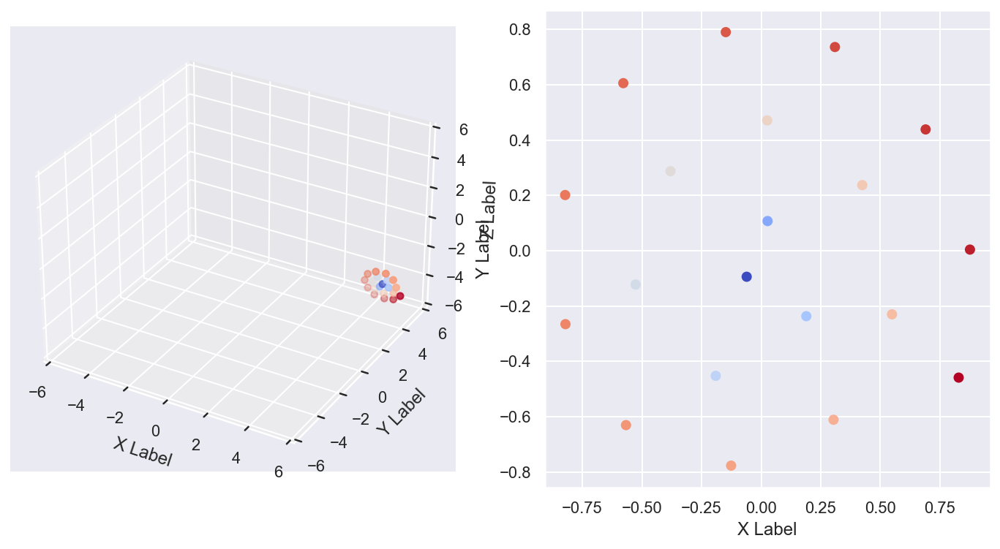

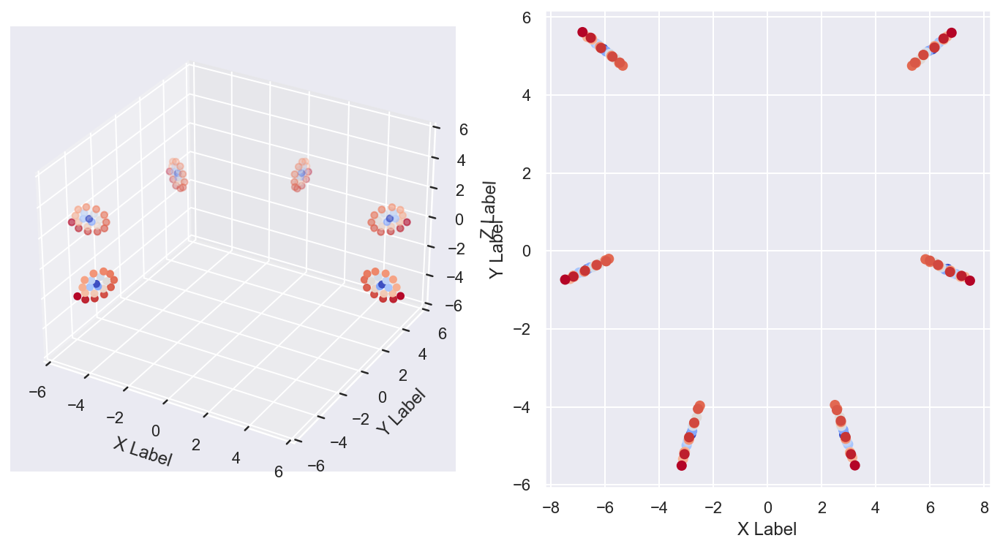

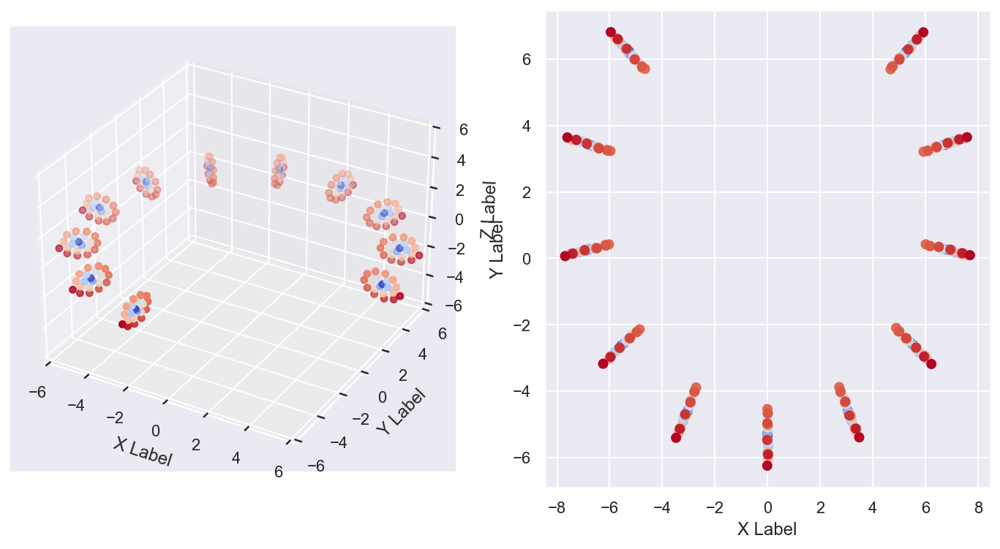

In [16]:
# TODO
# changing roll density
for i in range(1,16,5):
    show_KernelPCA(spiral_density=3, spiral_steps = 20, width=7, angle=0.8, roll_density=i)

#### MDE implementation

In [17]:
def show_MDE(spiral_density=3, spiral_steps = 20, width=7, angle=0.5, roll_density=5):
    fig = plt.figure()
    x,y,z,d=roll_generator(to_array=False, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)
    from mpl_toolkits.mplot3d import Axes3D

    # fig = plt.figure()
    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])

    ax2 = fig.add_subplot(122)
    points, d=roll_generator(to_array=True, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)

    embedding = MDS(n_components=2)
    points_transformed = embedding.fit_transform(points)
    points_transformed.shape

    points_transformed_t = points_transformed.T
    points_transformed_t.shape

    ax2.scatter(points_transformed_t[0], points_transformed_t[1], c=d, cmap=plt.cm.coolwarm)
    ax2.set_xlabel('X Label')
    ax2.set_ylabel('Y Label')
    
    plt.rcParams["figure.figsize"] = [12, 6]
    
    extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f'mde_spst{spiral_steps}_roldens{roll_density}_w{width}_a{angle}_sd{spiral_density}.png', bbox_inches=extent)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


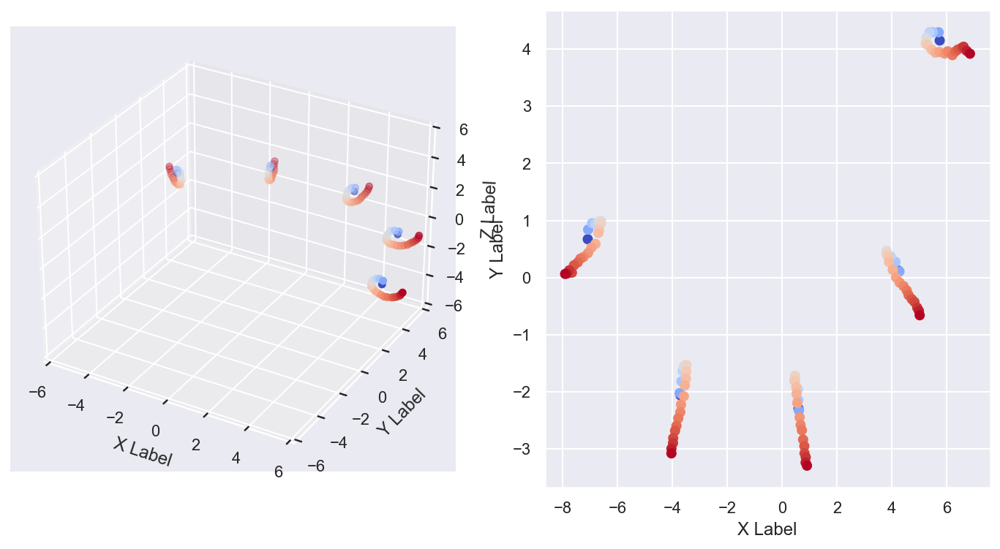

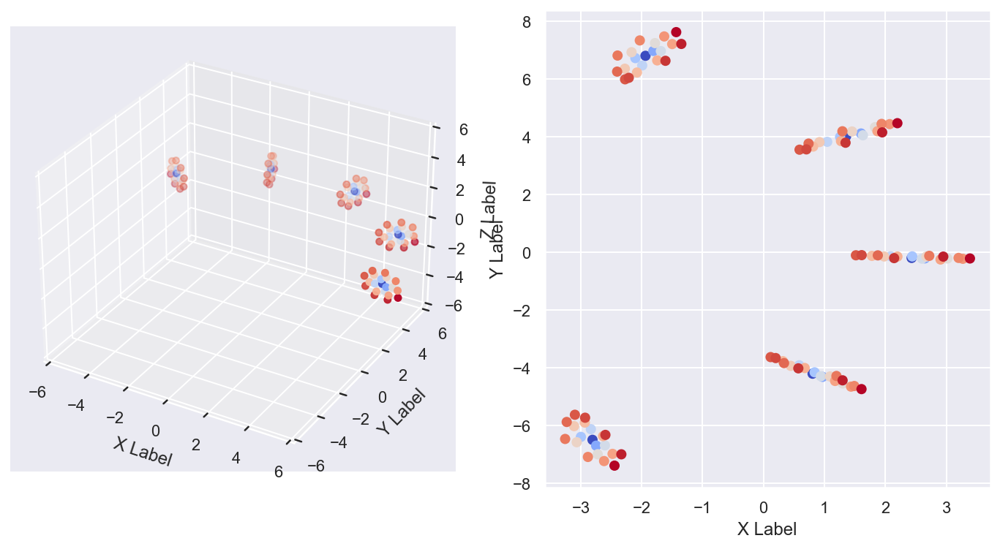

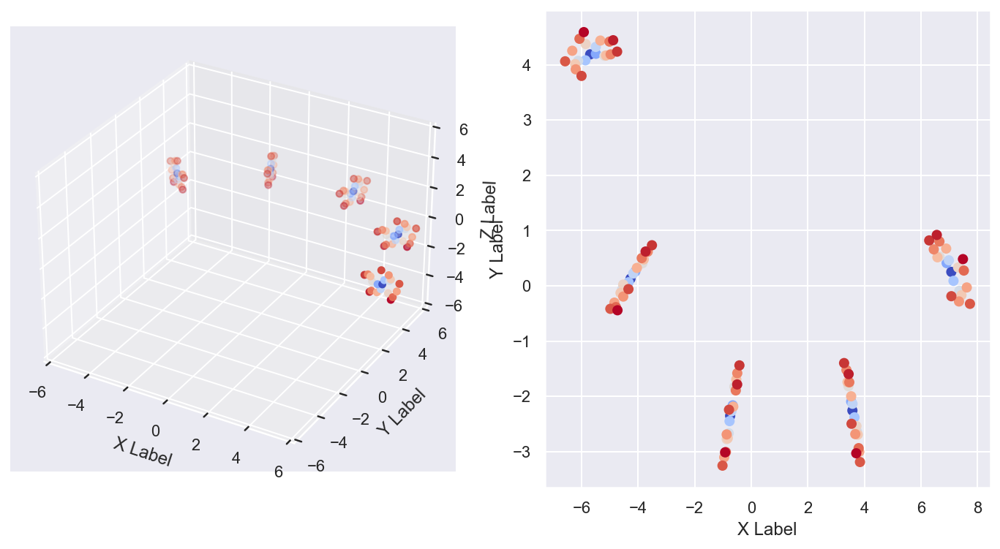

In [18]:
# TODO
# changing spiral density
for i in range(1,9,3):
    show_MDE(spiral_density=i, spiral_steps = 20, width=7, angle=0.5, roll_density=5)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


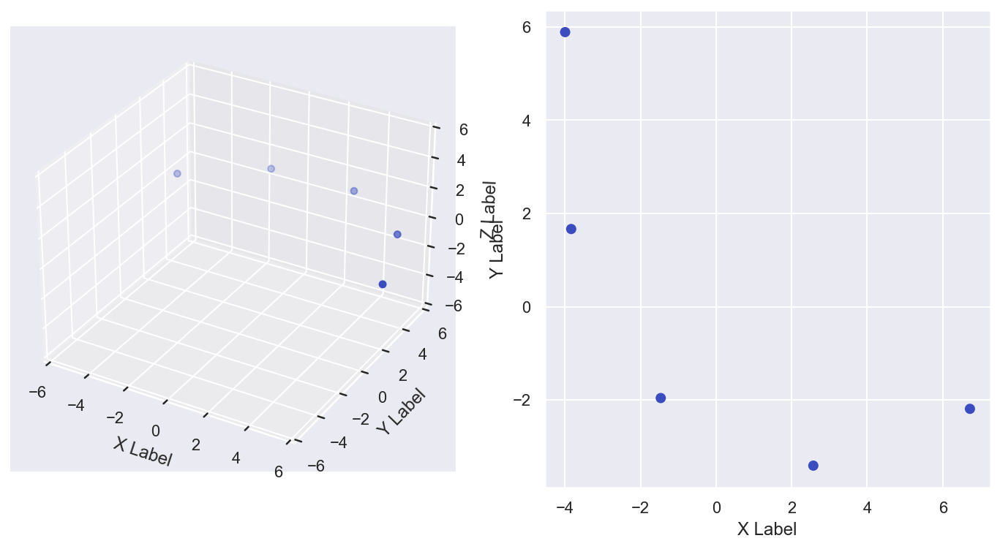

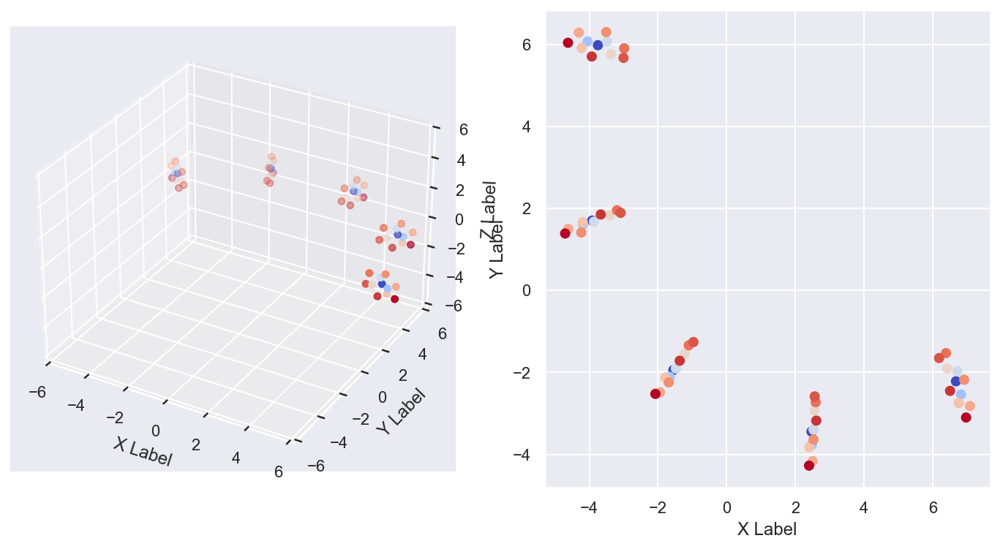

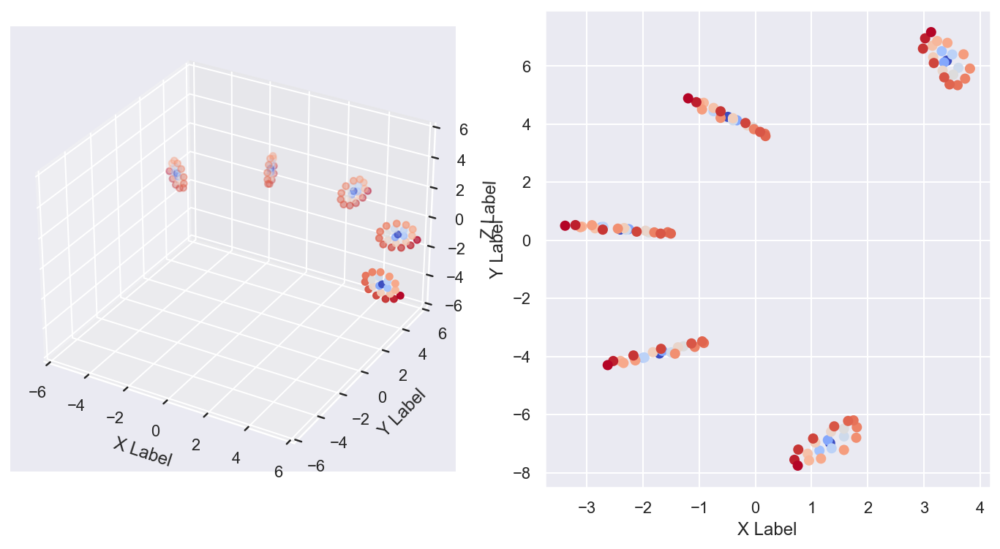

In [19]:
# TODO
# changing spiral steps
for i in range(1,30,10):
    show_MDE(spiral_density=3, spiral_steps = i, width=7, angle=0.5, roll_density=5)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


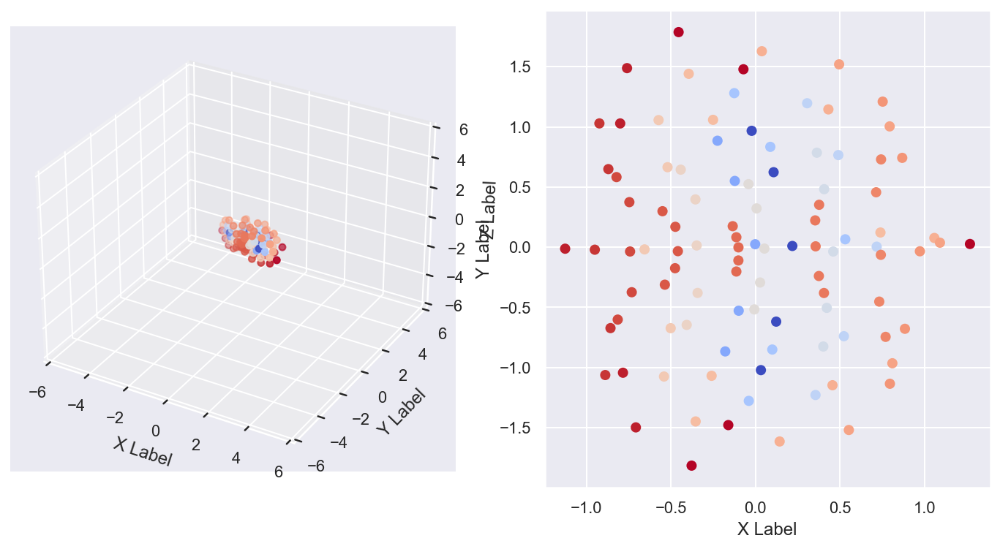

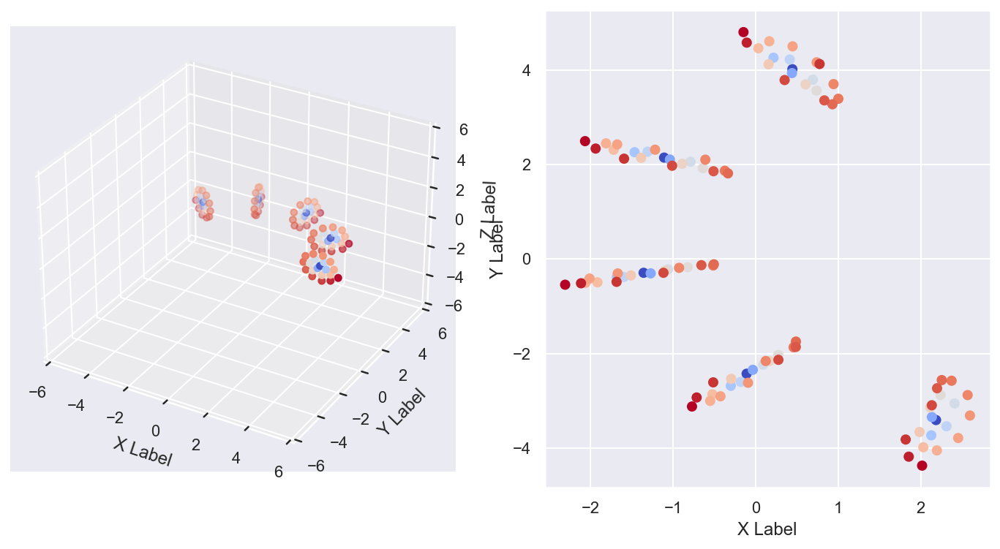

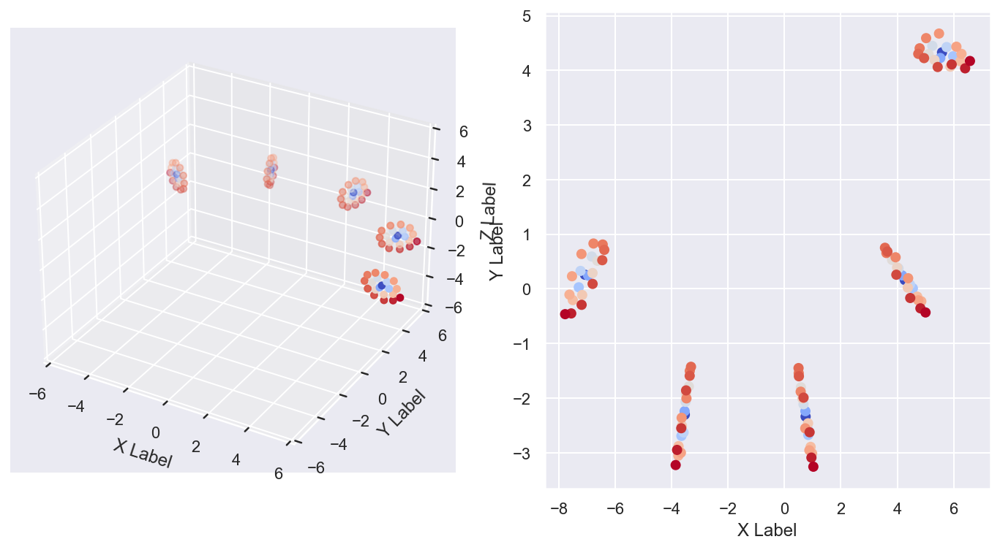

In [20]:
# TODO
# changing spiral width
for i in range(1,9,3):
    show_MDE(spiral_density=3, spiral_steps = 20, width=i, angle=0.5, roll_density=5)

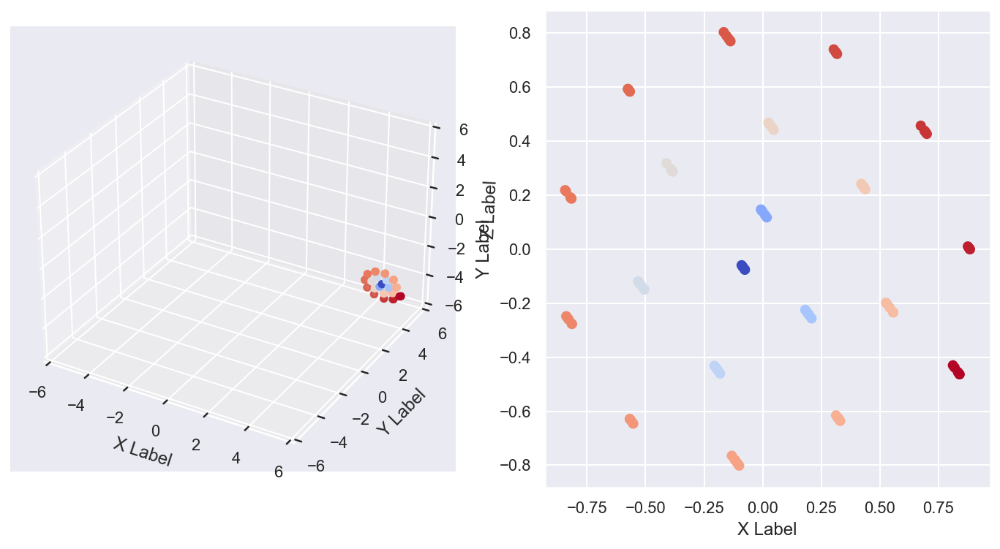

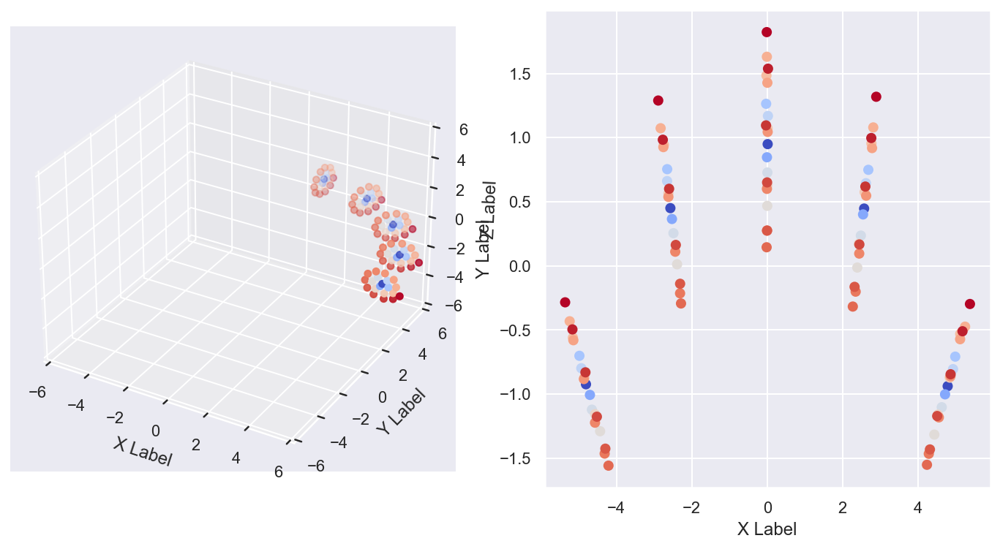

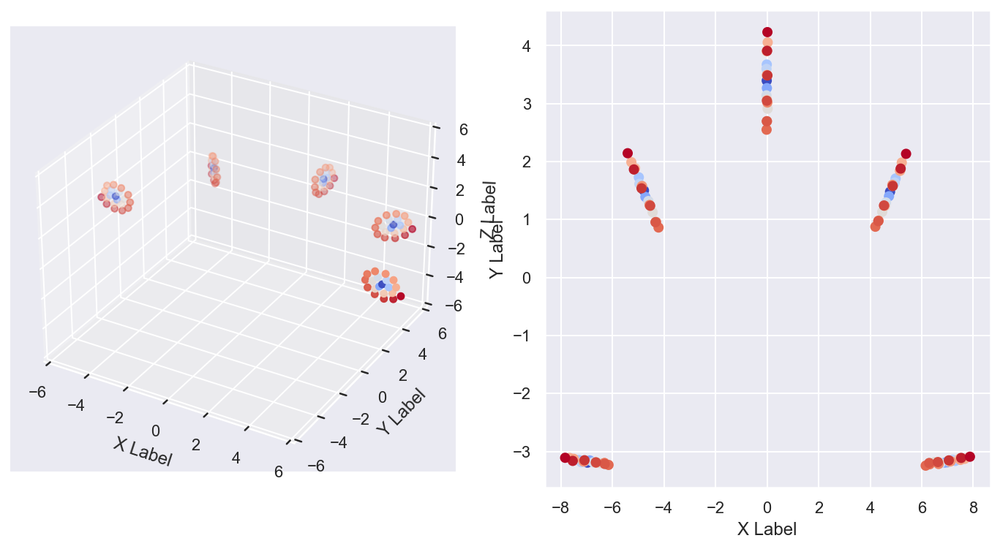

In [21]:
# TODO
# changing angle
for i in np.arange(0,0.9,0.3):
    show_KernelPCA(spiral_density=3, spiral_steps = 20, width=7, angle=i, roll_density=5)

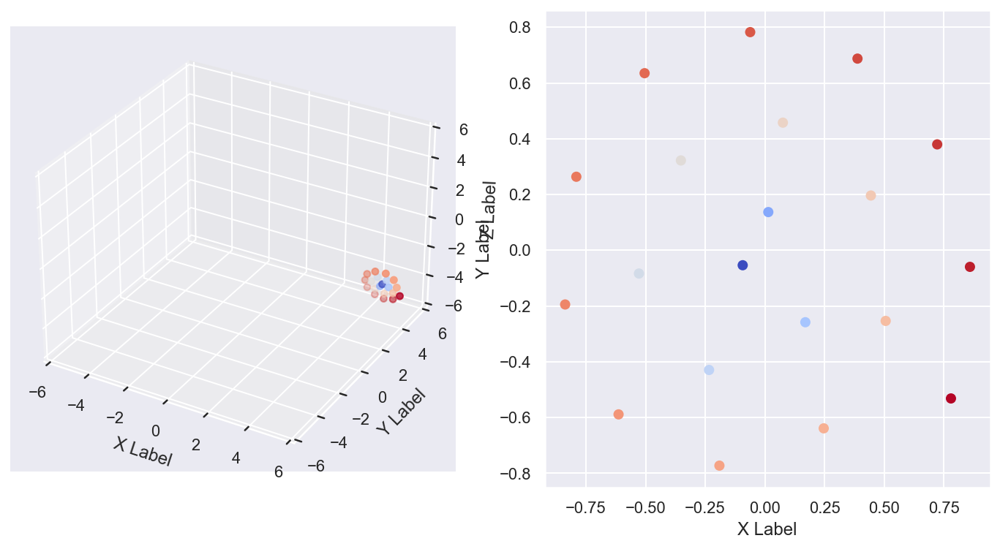

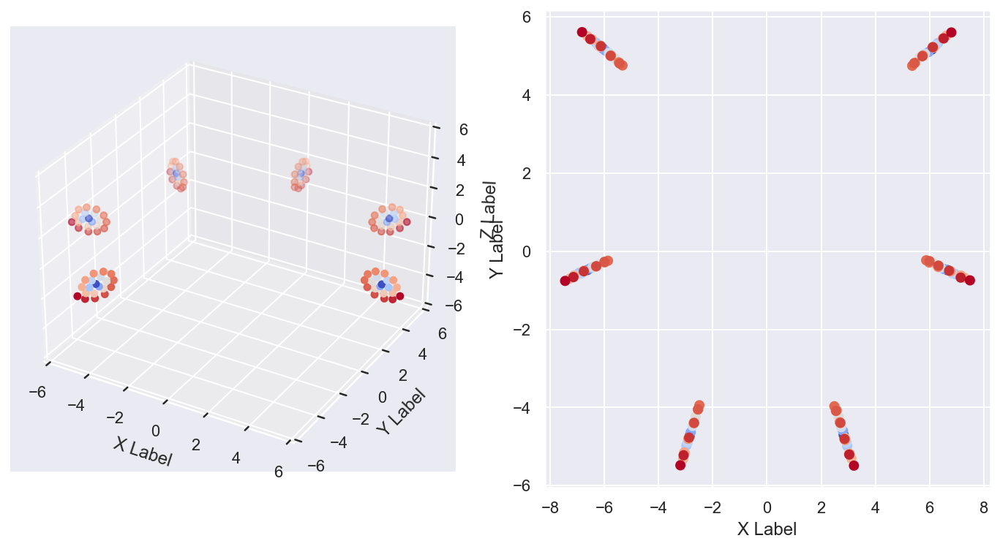

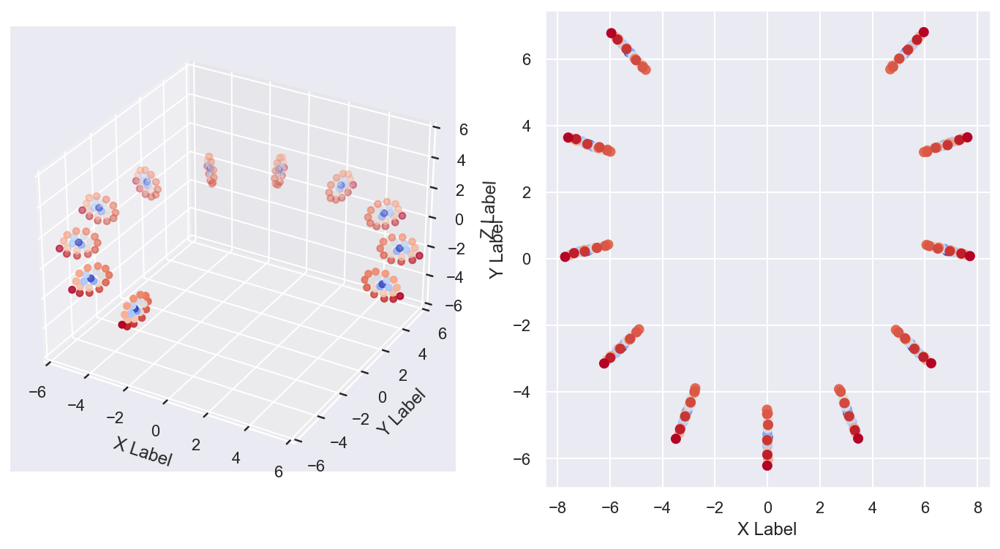

In [22]:
# TODO
# changing roll density
for i in range(1,16,5):
    show_KernelPCA(spiral_density=3, spiral_steps = 20, width=7, angle=0.8, roll_density=i)

#### t-SNE implementation

In [23]:

def show_tSNE(spiral_density=3, spiral_steps = 20, width=7, angle=0.5, roll_density=5, n_neighbors=5,
              metric='euclidean', perplexity=20):
    fig = plt.figure()
    x,y,z,d=roll_generator(to_array=False, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)
    from mpl_toolkits.mplot3d import Axes3D

    # fig = plt.figure()
    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=d, cmap=plt.cm.coolwarm)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.set_xlim([-6, 6])
    ax.set_ylim([-6, 6])
    ax.set_zlim([-6, 6])

    ax2 = fig.add_subplot(122)
    points, d=roll_generator(to_array=True, spiral_density=spiral_density,
                           spiral_steps = spiral_steps, width=width,
                           angle=angle, density=roll_density)

    from sklearn.manifold import TSNE
    points_transformed = TSNE(n_components=2, metric=metric, perplexity=perplexity).fit_transform(points)
    
    points_transformed_t = points_transformed.T


    ax2.scatter(points_transformed_t[0], points_transformed_t[1], c=d, cmap=plt.cm.coolwarm)
    ax2.set_xlabel('X Label')
    ax2.set_ylabel('Y Label')
    
    plt.rcParams["figure.figsize"] = [12, 6]
    
    extent = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(f'tsne_n{n_neighbors}_spst{spiral_steps}_roldens{roll_density}_w{width}_a{angle}_sd{spiral_density}.png', bbox_inches=extent)

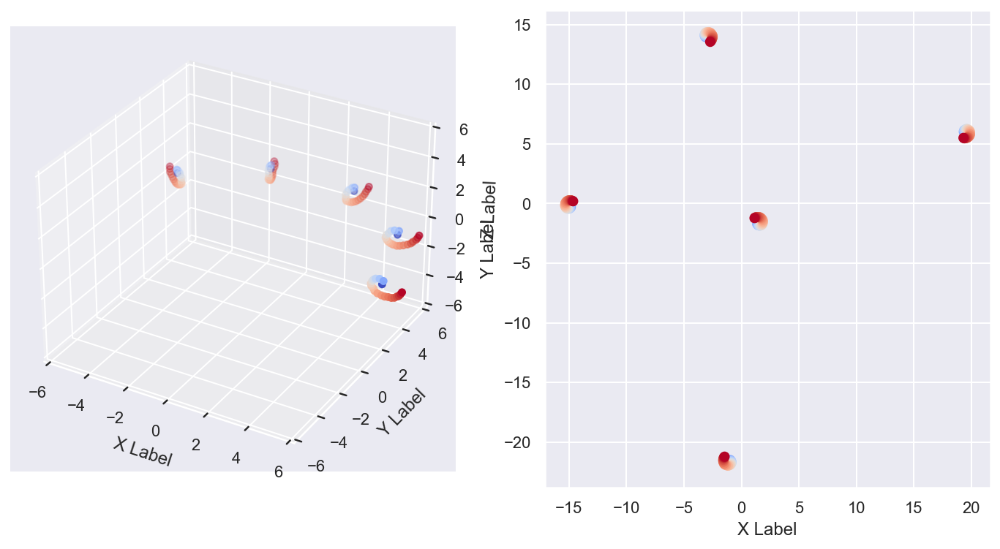

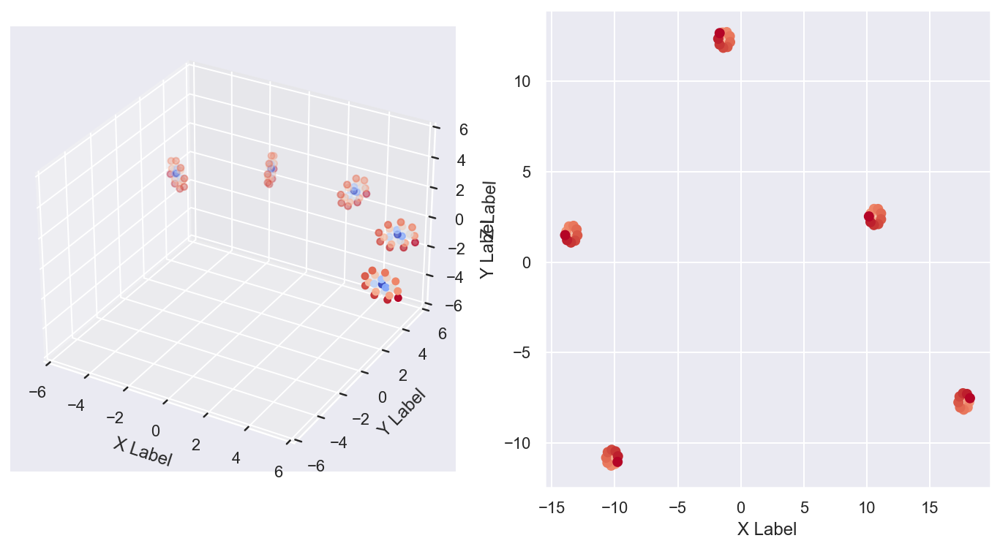

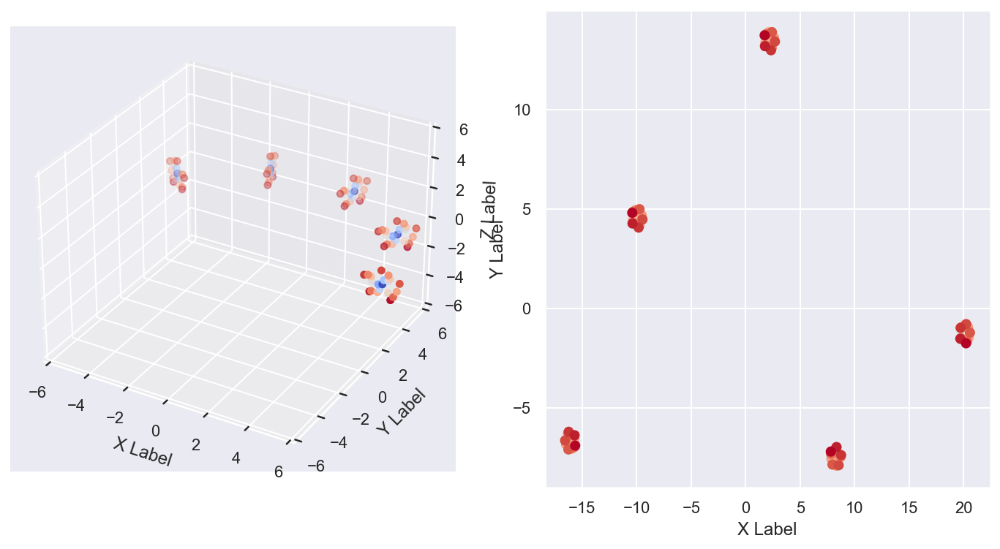

In [24]:
# TODO
# changing spiral density
for i in range(1,9,3):
    show_tSNE(spiral_density=i, spiral_steps = 20, width=7, angle=0.5, roll_density=5)

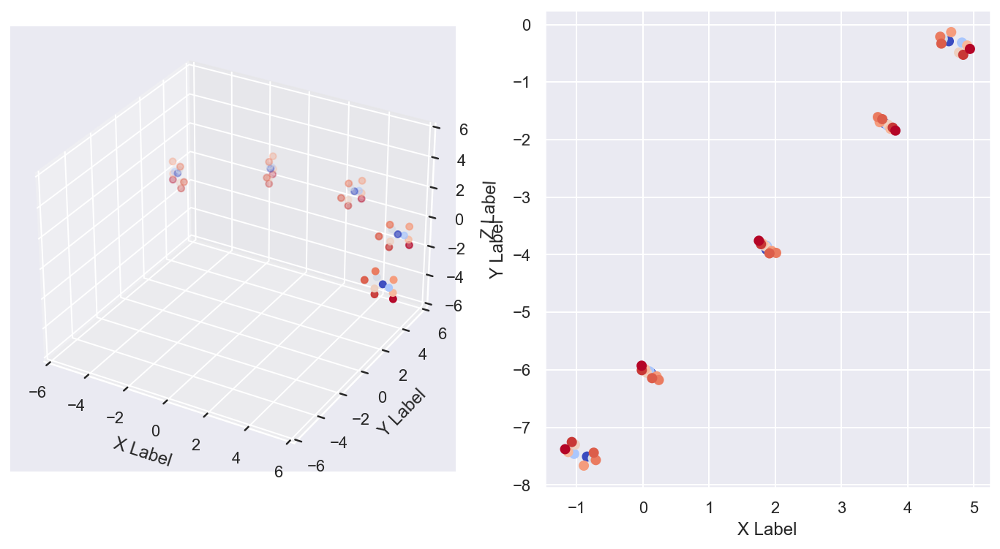

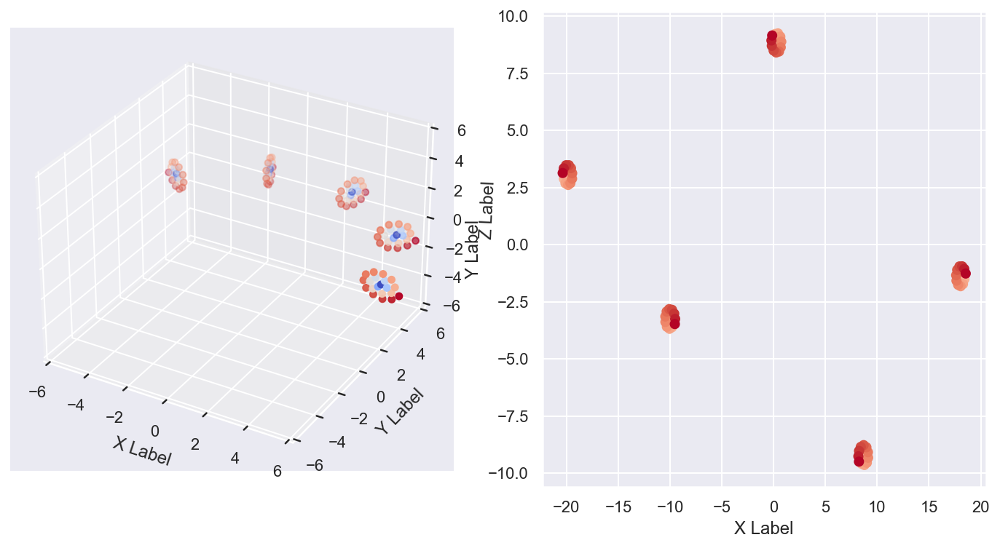

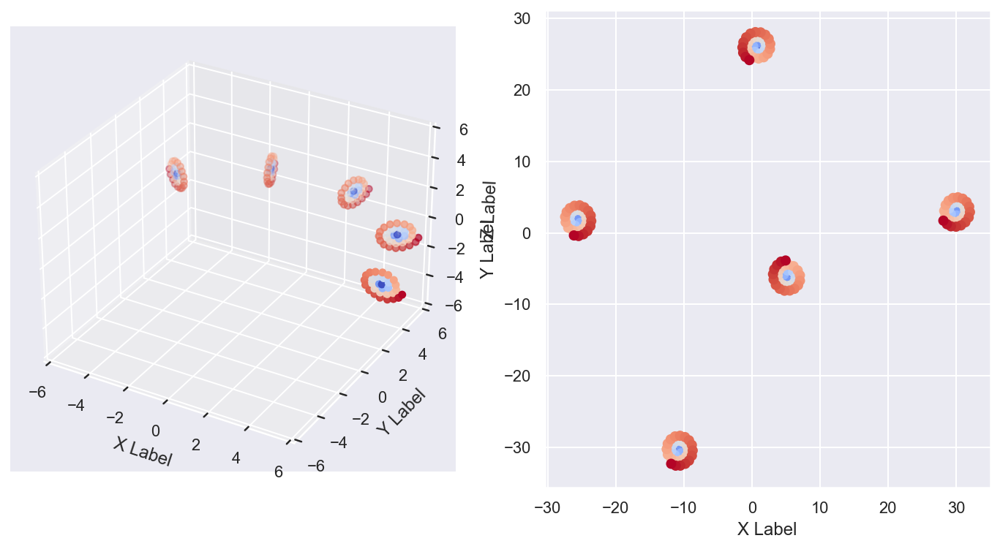

In [25]:
# TODO
# changing spiral steps
for i in range(10,31,10):
    show_tSNE(spiral_density=3, spiral_steps = i, width=7, angle=0.5, roll_density=5)

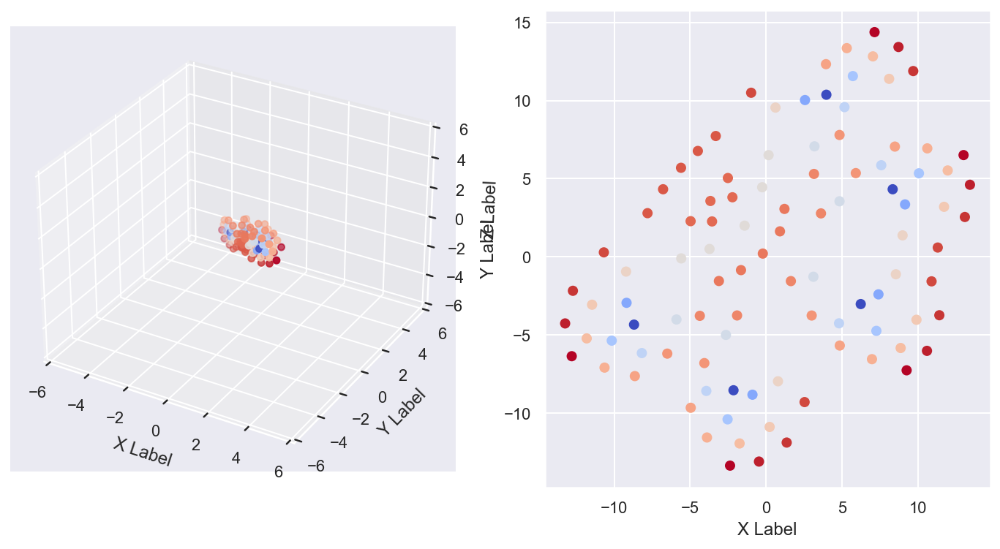

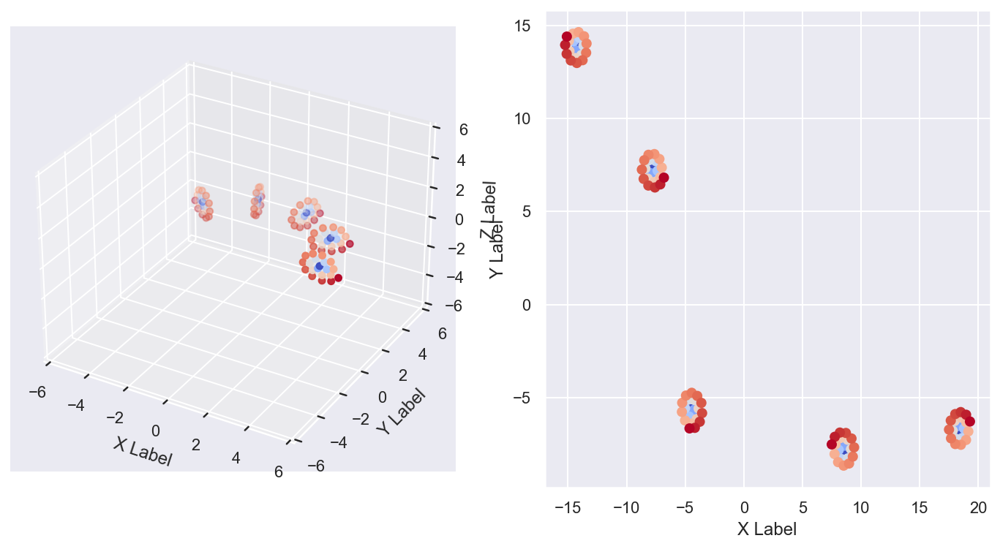

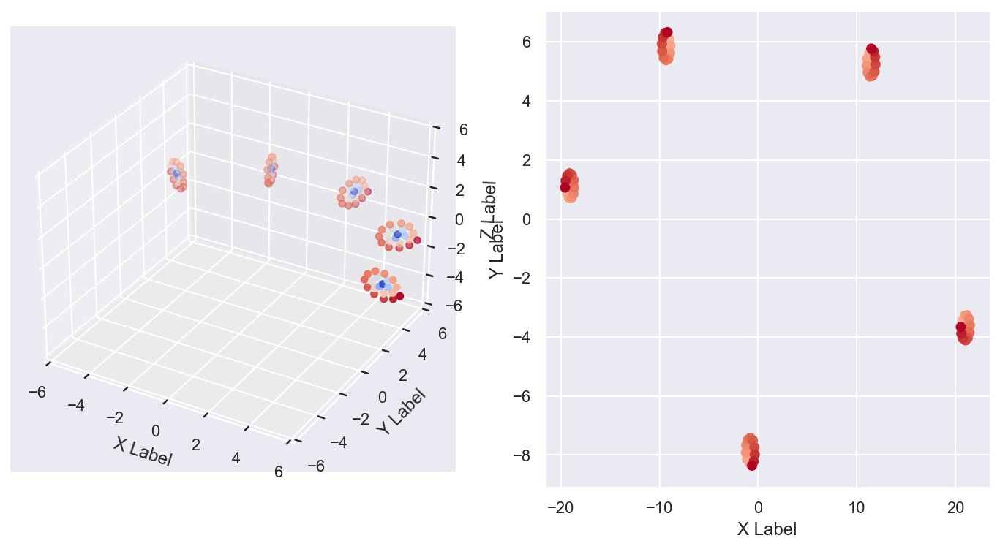

In [26]:
# TODO
# changing spiral width
for i in range(1,9,3):
    show_tSNE(spiral_density=3, spiral_steps = 20, width=i, angle=0.5, roll_density=5)

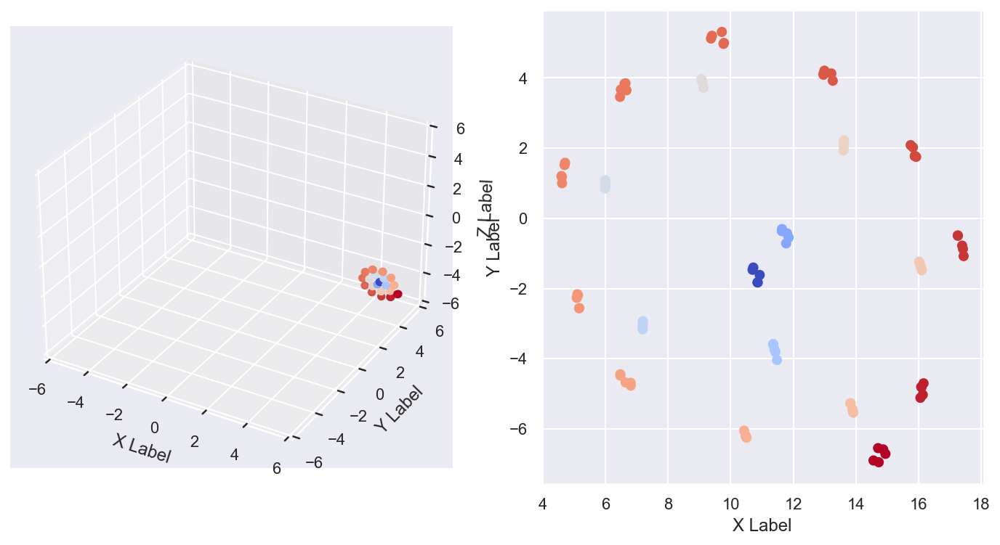

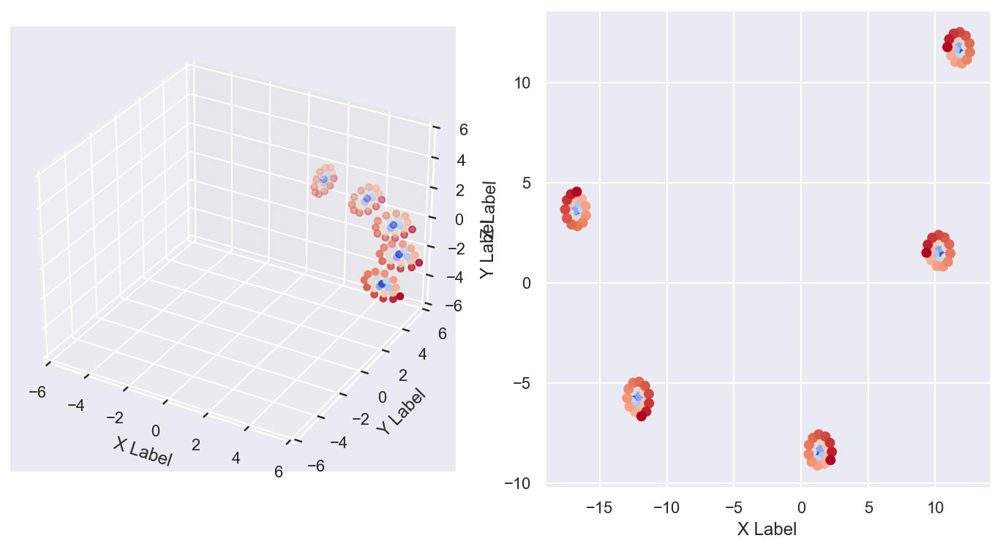

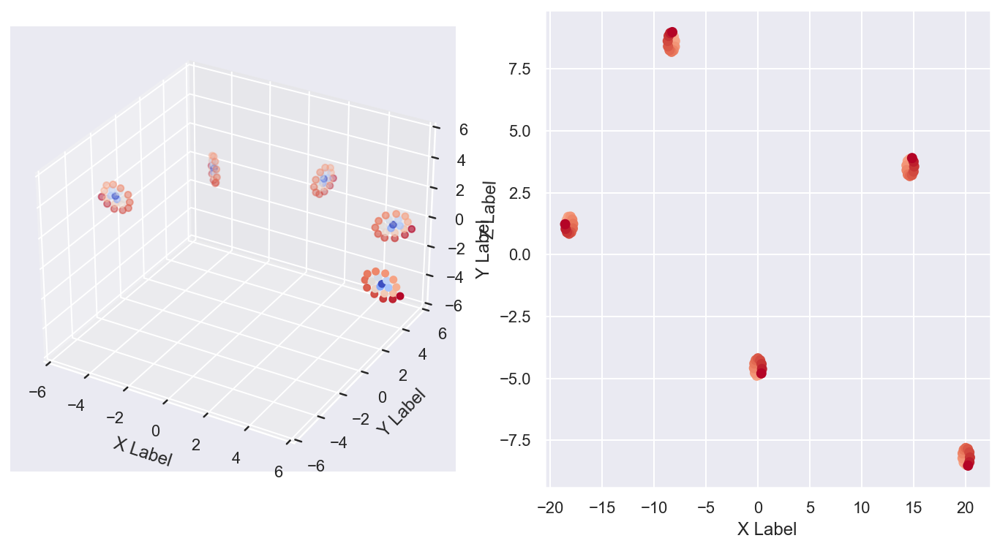

In [27]:
# TODO
# changing angle
for i in np.arange(0,0.9,0.3):
    show_tSNE(spiral_density=3, spiral_steps = 20, width=7, angle=i, roll_density=5)

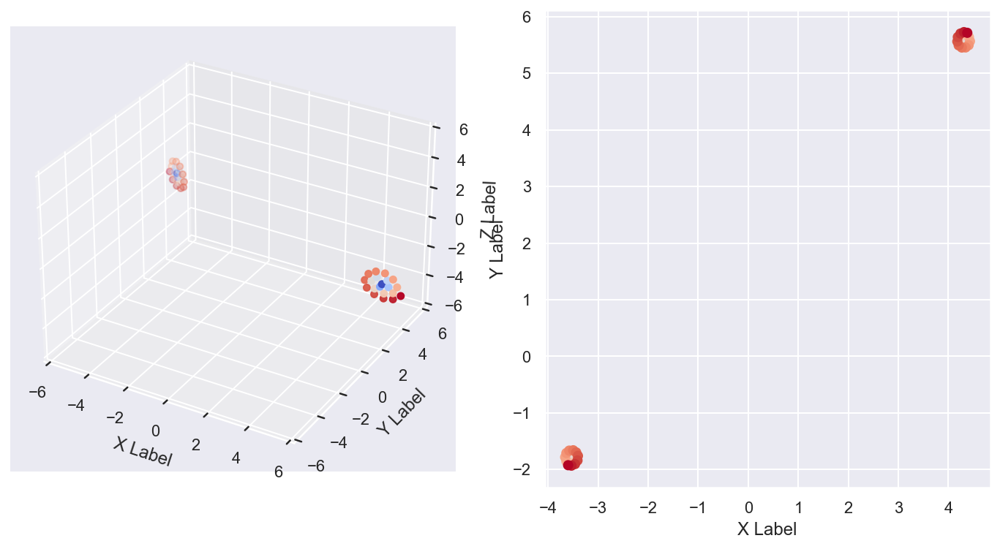

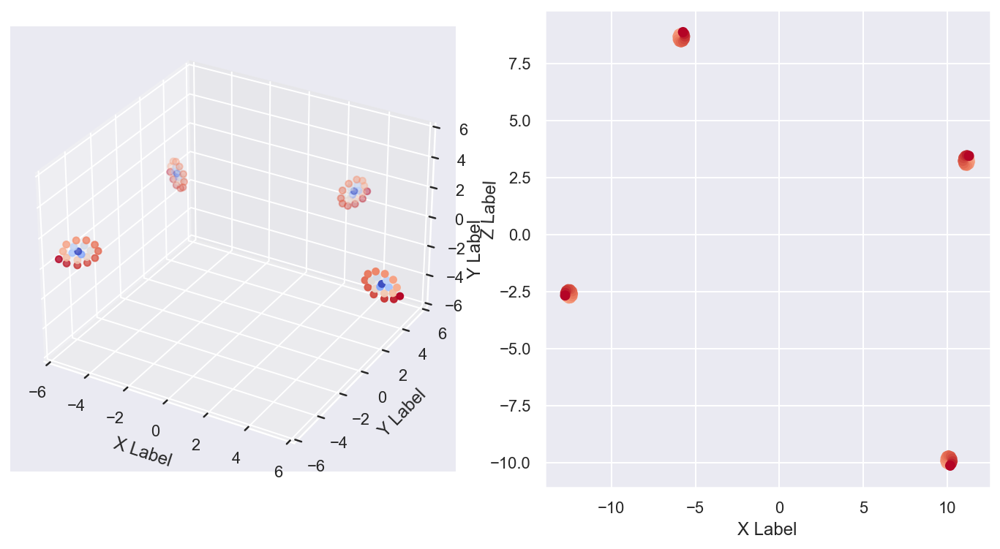

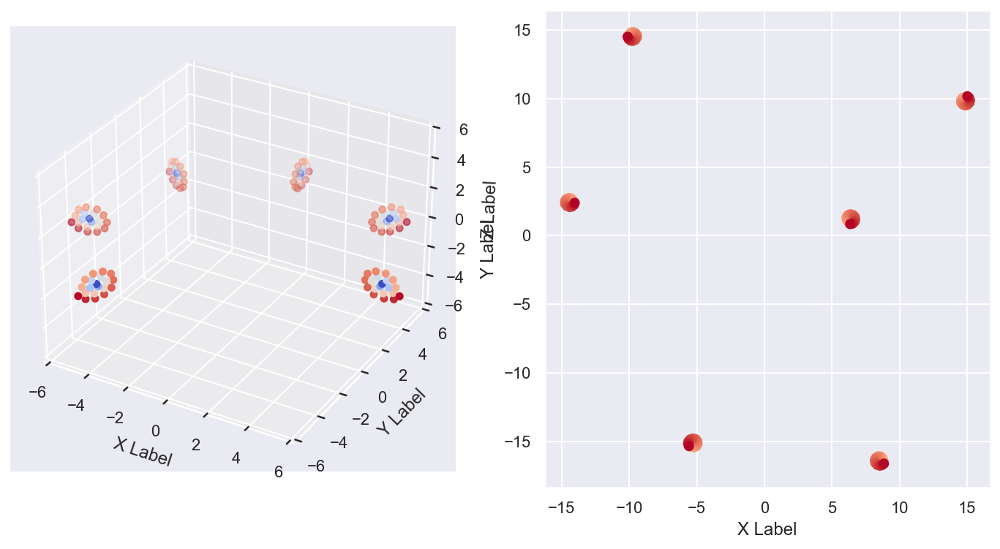

In [28]:
# TODO
# changing roll density
for i in range(2,7,2):
    show_tSNE(spiral_density=3, spiral_steps = 20, width=7, angle=0.8, roll_density=i)

### In this way, you should get a set of images showing the various available projections of the original roulade to the 2D plane. Treat these images as elements of a new data set, we treat image pixels as a high-dimensional vector. Use t-SNE to project the newly created set of 2d projection thumbnails into a 2-dimensional space.

In [69]:
# TODO
%pwd
%cd '/Users/agatadratwa/Documents/Studia Data Science/Semestr1/WizualizacjaDanych/Laboratoria/images'
import os
cwd = os.getcwd()
print("Current working directory:", cwd)

/Users/agatadratwa/Documents/Studia Data Science/Semestr1/WizualizacjaDanych/Laboratoria/images
Current working directory: /Users/agatadratwa/Documents/Studia Data Science/Semestr1/WizualizacjaDanych/Laboratoria/images


In [71]:
import matplotlib.pyplot as plt
import cv2
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.feature_extraction import image
from skimage import io
from sklearn.manifold import TSNE
from matplotlib.pyplot import imshow
from sklearn.preprocessing import StandardScaler

data = []
folder = '/Users/agatadratwa/Documents/Studia Data Science/Semestr1/WizualizacjaDanych/Laboratoria/images'

for filename in os.listdir(folder):
    image = cv2.imread(os.path.join(folder, filename))
    if image is not None:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (45,45))
        image = image.flatten()
        data.append([image, filename])

features, images  = zip(*data)

In [72]:
print(f"Exemplary element in data has the following structure:\n {data[0]}")

Exemplary element in data has the following structure:
 [array([235, 235, 235, ..., 235, 235, 235], dtype=uint8), 'mde_spst1_roldens5_w7_a0.5_sd3.png']


In [73]:
num_images_to_plot = len(images)
if len(images) > num_images_to_plot:
    sort_order = sorted(random.sample(range(len(images)), num_images_to_plot))
    images = [images[i] for i in sort_order]
    pca_features = [pca_features[i] for i in sort_order] 
    
# TSNE training 
X = np.array(standardied_features)
tsne = TSNE(n_components=2, verbose=2).fit_transform(X)

[t-SNE] Computing 52 nearest neighbors...
[t-SNE] Indexed 53 samples in 0.001s...
[t-SNE] Computed neighbors for 53 samples in 0.031s...
[t-SNE] Computed conditional probabilities for sample 53 / 53
[t-SNE] Mean sigma: 28.785093
[t-SNE] Computed conditional probabilities in 0.009s
[t-SNE] Iteration 50: error = 66.8762207, gradient norm = 0.4683980 (50 iterations in 0.028s)
[t-SNE] Iteration 100: error = 61.4317970, gradient norm = 0.5815939 (50 iterations in 0.025s)
[t-SNE] Iteration 150: error = 58.8624649, gradient norm = 0.5964448 (50 iterations in 0.022s)
[t-SNE] Iteration 200: error = 62.4485168, gradient norm = 0.6567820 (50 iterations in 0.023s)
[t-SNE] Iteration 250: error = 64.0766068, gradient norm = 0.4550482 (50 iterations in 0.025s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.076607
[t-SNE] Iteration 300: error = 0.6975729, gradient norm = 0.0132050 (50 iterations in 0.030s)
[t-SNE] Iteration 350: error = 0.5533501, gradient norm = 0.0074771 (50 

In [74]:
df_images_after_tsne = pd.DataFrame(data=tsne, columns=['Component 1', 'Component 2'])
df_images_after_tsne['Image Name'] = images
df_images_after_tsne.head()

,Component 1,Component 2,Image Name
0,-1.198944,0.148750,mde_spst1_roldens5_w7_a0.5_sd3.png
1,-1.076656,0.057218,pca_spst20_roldens5_w7_a0.5_sd1.png
2,-0.337057,0.279946,pca_spst20_roldens5_w7_a0.5_sd3.png
3,-0.438654,0.460335,pca_spst20_roldens5_w7_a0.5_sd7.png
4,-1.201975,0.144482,tsne_n5_spst20_roldens4_w7_a0.8_sd3.png


In [75]:
# standarization
tsne_standarized = StandardScaler().fit_transform(tsne)   
component1 = tsne_standarized[:, 0]
component2 = tsne_standarized[:, 1]

mde_spst1_roldens5_w7_a0.5_sd3.png
pca_spst20_roldens5_w7_a0.5_sd1.png
pca_spst20_roldens5_w7_a0.5_sd3.png
pca_spst20_roldens5_w7_a0.5_sd7.png
tsne_n5_spst20_roldens4_w7_a0.8_sd3.png
tsne_n5_spst10_roldens5_w7_a0.5_sd3.png
pca_spst20_roldens5_w7_a0.5_sd4.png
tsne_n5_spst20_roldens5_w7_a0.3_sd3.png
pca_spst20_roldens5_w1_a0.5_sd3.png
kpca_spst20_roldens5_w7_a0.3_sd3.png
kpca_spst11_roldens5_w7_a0.5_sd3.png
pca_spst20_roldens5_w7_a0.6_sd3.png
mde_spst11_roldens5_w7_a0.5_sd3.png
tsne_n5_spst20_roldens5_w4_a0.5_sd3.png
pca_spst20_roldens1_w7_a0.8_sd3.png
kpca_spst1_roldens5_w7_a0.5_sd3.png
mde_spst20_roldens5_w4_a0.5_sd3.png
kpca_spst20_roldens5_w4_a0.5_sd3.png
tsne_n5_spst20_roldens5_w7_a0.0_sd3.png
tsne_n5_spst30_roldens5_w7_a0.5_sd3.png
pca_spst20_roldens6_w7_a0.8_sd3.png
kpca_spst20_roldens5_w7_a0.0_sd3.png
pca_spst21_roldens5_w7_a0.5_sd3.png
tsne_n5_spst20_roldens2_w7_a0.8_sd3.png
kpca_spst20_roldens11_w7_a0.8_sd3.png
tsne_n5_spst20_roldens5_w7_a0.5_sd1.png
mde_spst20_roldens5_w7_a0.5

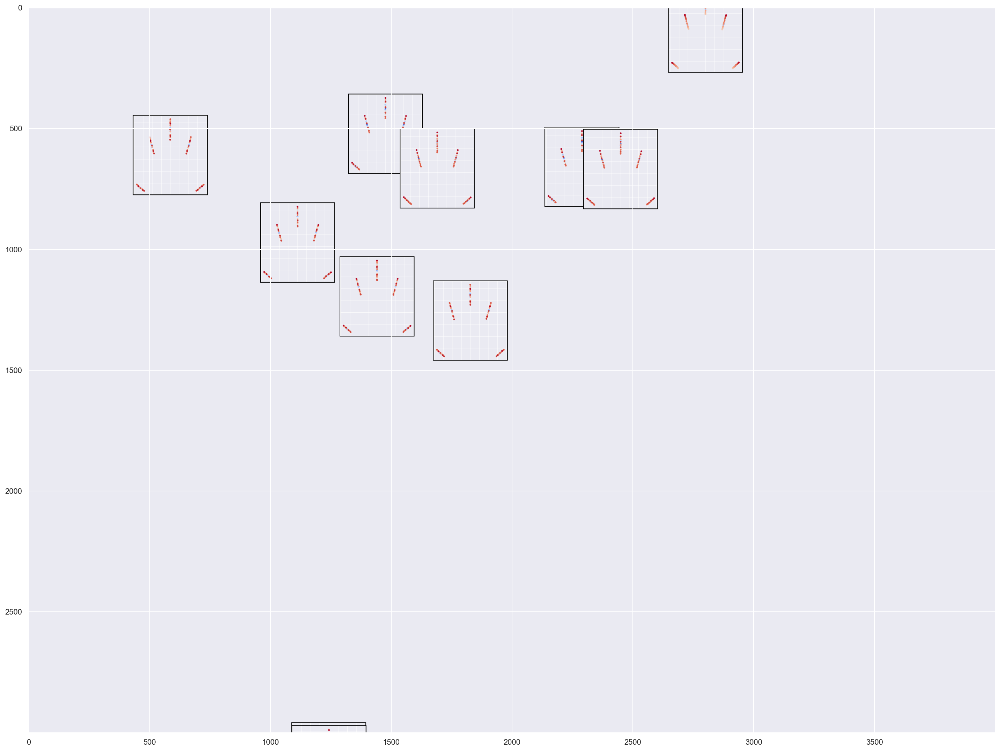

In [89]:
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

from PIL import ImageOps

width = 4000
height = 3000
max_dim = 100

border_color = "black"
border = (3, 3, 3, 3)

full_image = Image.new('RGBA', (width, height))

for img, x, y in zip(images, component1, component2):
    print(img)
    tile = Image.open(img)
    tile = ImageOps.expand(tile, border=border, fill=border_color)
    rs = max(1, 0.3*tile.width/max_dim, 0.3*tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))
# Create the plot
fig, ax = plt.subplots(figsize=(20, 16))
ax.imshow(full_image)

plt.show()

On the plot we can see only two clusters (one is cutted), the rest of them aren't visibile because of the parameters that we have chosen at the beginning when images were created. This means that cluster vary from each other a lot and it's hard to visualise all of them on one plot.

# homework - work with more complex data (higher dimensionality).

- use a basic machine learning set representing black and white scans of 32x32 pixel handwritten digits (MNIST)
- apply dimensionality reduction on these data using PCA, MDS and t-SNE methods
- Plot results
- Pick first 1000-2000 points as TSNE takes a lot of time for all samples


In [30]:
from sklearn.datasets import fetch_openml

# Download and load the MNIST dataset
mnist = fetch_openml('mnist_784', version=1, cache=True)

# Split the dataset into training and testing sets, getting only first 4000 observations for faster compilation
X = mnist.data[:4000]
y = mnist.target[:4000].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(y_train.shape)


/opt/anaconda3/lib/python3.8/site-packages/sklearn/datasets/_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


KeyboardInterrupt: 

### PCA implementation

In [ ]:
# TODO
# PCA training
pca = PCA(n_components=2)
mnist_pca = pca.fit_transform(X_train)
print(mnist_pca.shape)

In [ ]:
plt.figure(figsize=(8, 8))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown']
for i in range(10):
    plt.scatter(mnist_pca[y_train == i, 0], mnist_pca[y_train == i, 1], color=colors[i], label=str(i), alpha=0.5)
plt.legend()
plt.title("MNIST Dataset after PCA")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.tight_layout()
plt.show()

### MDS implementation

In [ ]:
# training MDS
mds = MDS(n_components=2)
mnist_mds = mds.fit_transform(X_train)

In [ ]:
# plotting MDS
plt.figure(figsize=(8, 8))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown']
for i in range(10):
    plt.scatter(mnist_mds[y_train == i, 0], mnist_mds[y_train == i, 1], color=colors[i], label=str(i), alpha=0.5)
plt.legend()
plt.title("MNIST Dataset after MDS")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.tight_layout()
plt.show()

### TSNE implementation

In [ ]:
# TSNE training
tsne = TSNE(n_components=2, perplexity=30)
mnist_tsne = tsne.fit_transform(X_train)

In [ ]:
# plotting TSNE
plt.figure(figsize=(8, 8))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown']
for i in range(10):
    plt.scatter(mnist_tsne[y_train == i, 0], mnist_tsne[y_train == i, 1], color=colors[i], label=str(i), alpha=0.5)
plt.legend()
plt.title("MNIST Dataset after TSNE")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.tight_layout()
plt.show()

### Conclusions
+ PCA is an algorithm for lineary seperated data and mnist data set is not so the results aren't satisfactory. We can see distinguished clusters but they aren't seperate clearly.
+ MDS is an algorithm that calculates distances between points so it's very time complex. From all three algorithms it took the longest time to compile. It managed to distinguish only one cluster (number one), others are mixed with each other
+ Definitely TSNE performed the best from all algorithms, the clusters are distiguish rather clearly with a few exceptions. Also it performed much faster than MDS. It is worth to mention that local seperation is good but global seperation is worse - this is very common when it comes to TSNE algorithm. For example number one and eight are very similar so the clusters should be close to each other but on this plot they are rather far.